# Data Science Milestone 2 Phase 1

by: Muhammad Farhan Zahirsyah

Batch 10

---
### Desctription
Costumer Personality analysis adalah analisis terperinci tentang pelanggan ideal perusahaan. Ini membantu bisnis untuk lebih memahami pelanggannya dan memudahkan mereka untuk memodifikasi produk sesuai dengan kebutuhan, perilaku, dan perhatian khusus dari berbagai jenis pelanggan.

Costumer Personality analysis membantu bisnis untuk memodifikasi produknya berdasarkan target pelanggan dari berbagai jenis segmen pelanggan. Misalnya, daripada mengeluarkan uang untuk memasarkan produk baru ke setiap pelanggan di database perusahaan, perusahaan dapat menganalisis segmen pelanggan mana yang paling mungkin membeli produk dan kemudian memasarkan produk hanya pada segmen tertentu.


People

|feature|description|
|---|---|
|ID| Customer's unique identifier|
|Year_Birth| Customer's birth year|
|Education| Customer's education level|
|Marital_Status| Customer's marital status|
|Income| Customer's yearly household income|
|Kidhome| Number of children in customer's household|
|Teenhome| Number of teenagers in customer's household|
|Dt_Customer| Date of customer's enrollment with the company|
|Recency| Number of days since customer's last purchase|
|Complain| 1 if the customer complained in the last 2 years, 0 otherwise|

Products

|feature|description|
|---|---|
|MntWines| Amount spent on wine in last 2 years|
|MntFruits| Amount spent on fruits in last 2 years|
|MntMeatProducts| Amount spent on meat in last 2 years|
|MntFishProducts| Amount spent on fish in last 2 years|
|MntSweetProducts| Amount spent on sweets in last 2 years|
|MntGoldProds| Amount spent on gold in last 2 years

Place

|feature|description|
|---|---|
|NumWebPurchases| Number of purchases made through the company’s website|
|NumCatalogPurchases| Number of purchases made using a catalogue|
|NumStorePurchases| Number of purchases made directly in stores|
|NumWebVisitsMonth| Number of visits to company’s website in the last month|



### Objective
- Melakukan segmentasi konsumen untuk menentukan marketing strategy dengan menggunakan unsupervised machine learning


### Problem Statement
- bagaimana cara melakukan segmentasi konsumen untuk menentukan marketing strategy dengan menggunakan unsupervised machine learning


---


## I. Import Library

In [1]:
# essential libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import matplotlib
import matplotlib.cm as cm
import statsmodels.api as sm
import sklearn

# scikit-learn library
from sklearn.preprocessing import StandardScaler,OrdinalEncoder,MinMaxScaler,OneHotEncoder,Normalizer
from sklearn.metrics import silhouette_samples, silhouette_score
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.cluster import DBSCAN,KMeans,AgglomerativeClustering
from sklearn.decomposition import PCA
from sklearn import metrics
from sklearn.mixture import GaussianMixture

#statsmodels library
from statsmodels.stats.outliers_influence import variance_inflation_factor


# removing warnings in cell
import warnings
warnings.filterwarnings('ignore')

# capping outlier library winsorizer
from feature_engine.outliers import Winsorizer,OutlierTrimmer


Memangil version, apabila program ini digunakan di masa mendatang kemungkinan library sudah ada pembaharuan dan versi yang digunakan sekarang sudah deprecated

In [2]:
print('Pandas Version     :',pd.__version__)
print('Numpy Version      :',np.__version__)
print('Statsmodels Version:',sm.__version__)
print('Matplotlib Version :',matplotlib.__version__)
print('Seaborn Version    :',sns.__version__)
print('Sklearn Version    :',sklearn.__version__)

Pandas Version     : 1.3.4
Numpy Version      : 1.20.3
Statsmodels Version: 0.12.2
Matplotlib Version : 3.4.3
Seaborn Version    : 0.11.2
Sklearn Version    : 1.0.2


## II. Data Loading

mengambil dataset dari path lokal

In [3]:
df_ori = pd.read_csv('marketing_campaign.csv',sep='\t')

In [4]:
df_ori.head()

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
0,5524,1957,Graduation,Single,58138.0,0,0,04-09-2012,58,635,...,7,0,0,0,0,0,0,3,11,1
1,2174,1954,Graduation,Single,46344.0,1,1,08-03-2014,38,11,...,5,0,0,0,0,0,0,3,11,0
2,4141,1965,Graduation,Together,71613.0,0,0,21-08-2013,26,426,...,4,0,0,0,0,0,0,3,11,0
3,6182,1984,Graduation,Together,26646.0,1,0,10-02-2014,26,11,...,6,0,0,0,0,0,0,3,11,0
4,5324,1981,PhD,Married,58293.0,1,0,19-01-2014,94,173,...,5,0,0,0,0,0,0,3,11,0


diatas adalah 5 baris pertama dataset

In [5]:
df_ori.head(5).T

,0,1,2,3,4
ID,5524,2174,4141,6182,5324
Year_Birth,1957,1954,1965,1984,1981
Education,Graduation,Graduation,Graduation,Graduation,PhD
Marital_Status,Single,Single,Together,Together,Married
Income,58138.0,46344.0,71613.0,26646.0,58293.0
Kidhome,0,1,0,1,1
Teenhome,0,1,0,0,0
Dt_Customer,04-09-2012,08-03-2014,21-08-2013,10-02-2014,19-01-2014
Recency,58,38,26,26,94
MntWines,635,11,426,11,173


Diatas menampilkan 5 data teratas dengan menampilkan nama seluruh kolom

In [6]:
df_ori.shape

(2240, 29)

Terdapat 2240 baris dan 29 kolom

In [7]:
df_ori.select_dtypes(include=np.number).describe().T.style.background_gradient(cmap='RdBu_r')

,count,mean,std,min,25%,50%,75%,max
ID,2240.000000,5592.159821,3246.662198,0.000000,2828.250000,5458.500000,8427.750000,11191.000000
Year_Birth,2240.000000,1968.805804,11.984069,1893.000000,1959.000000,1970.000000,1977.000000,1996.000000
Income,2216.000000,52247.251354,25173.076661,1730.000000,35303.000000,51381.500000,68522.000000,666666.000000
Kidhome,2240.000000,0.444196,0.538398,0.000000,0.000000,0.000000,1.000000,2.000000
Teenhome,2240.000000,0.506250,0.544538,0.000000,0.000000,0.000000,1.000000,2.000000
Recency,2240.000000,49.109375,28.962453,0.000000,24.000000,49.000000,74.000000,99.000000
MntWines,2240.000000,303.935714,336.597393,0.000000,23.750000,173.500000,504.250000,1493.000000
MntFruits,2240.000000,26.302232,39.773434,0.000000,1.000000,8.000000,33.000000,199.000000
MntMeatProducts,2240.000000,166.950000,225.715373,0.000000,16.000000,67.000000,232.000000,1725.000000
MntFishProducts,2240.000000,37.525446,54.628979,0.000000,3.000000,12.000000,50.000000,259.000000


ada beberapa kolom seperti AcceptedCmp1, AcceptedCmp2, AcceptedCmp3, AcceptedCmp4, AcceptedCmp5, complain dan response memiliki nilai binary 1 dan 0

dan nilai 66666 pada kolom income

In [8]:
df_ori.select_dtypes(include='O').describe().T

,count,unique,top,freq
Education,2240,5,Graduation,1127
Marital_Status,2240,8,Married,864
Dt_Customer,2240,663,31-08-2012,12


diatas adalah describe dari feature berdatatype categorical

In [9]:
df_ori.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2240 entries, 0 to 2239
Data columns (total 29 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   ID                   2240 non-null   int64  
 1   Year_Birth           2240 non-null   int64  
 2   Education            2240 non-null   object 
 3   Marital_Status       2240 non-null   object 
 4   Income               2216 non-null   float64
 5   Kidhome              2240 non-null   int64  
 6   Teenhome             2240 non-null   int64  
 7   Dt_Customer          2240 non-null   object 
 8   Recency              2240 non-null   int64  
 9   MntWines             2240 non-null   int64  
 10  MntFruits            2240 non-null   int64  
 11  MntMeatProducts      2240 non-null   int64  
 12  MntFishProducts      2240 non-null   int64  
 13  MntSweetProducts     2240 non-null   int64  
 14  MntGoldProds         2240 non-null   int64  
 15  NumDealsPurchases    2240 non-null   i

terdapat 2240 baris data

In [10]:
df_ori.isnull().sum()

ID                      0
Year_Birth              0
Education               0
Marital_Status          0
Income                 24
Kidhome                 0
Teenhome                0
Dt_Customer             0
Recency                 0
MntWines                0
MntFruits               0
MntMeatProducts         0
MntFishProducts         0
MntSweetProducts        0
MntGoldProds            0
NumDealsPurchases       0
NumWebPurchases         0
NumCatalogPurchases     0
NumStorePurchases       0
NumWebVisitsMonth       0
AcceptedCmp3            0
AcceptedCmp4            0
AcceptedCmp5            0
AcceptedCmp1            0
AcceptedCmp2            0
Complain                0
Z_CostContact           0
Z_Revenue               0
Response                0
dtype: int64

terdapat 24 missing value pada kolom income

## III. Exploratory Data Analysis

melihat korelasi antar feature dengan menggunakan pairplot

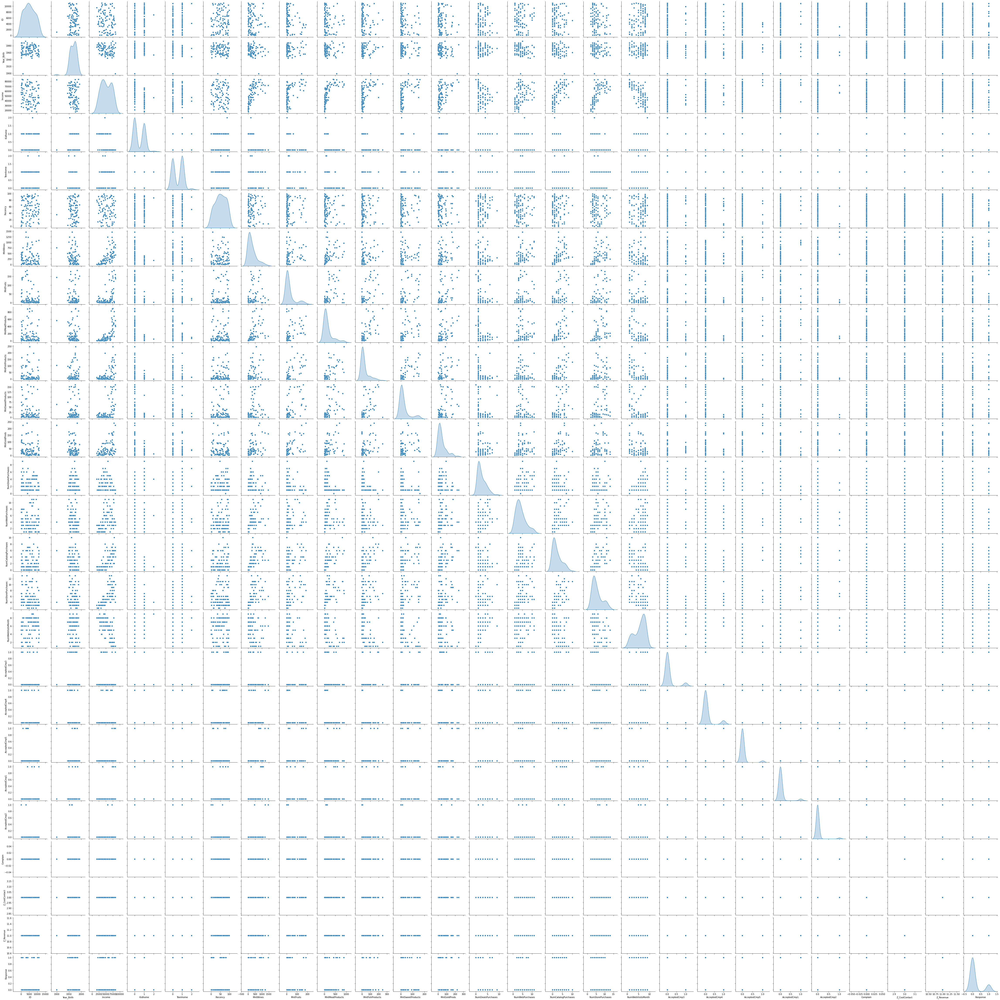

In [11]:
sns.pairplot(df_ori.sample(100),diag_kind='kde')

banyak data kategori yang berbentuk angka sehingga pairplotnya seperti diatas

membuat data inference dengan mengambil 10 data sample

In [12]:
data_inf = df_ori.sample(10,random_state=1)
data_inf

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
779,10736,1971,Graduation,Single,72258.0,0,1,12-09-2013,28,522,...,2,0,0,0,0,0,0,3,11,0
389,9799,1968,PhD,Divorced,83664.0,1,1,08-05-2013,57,866,...,5,0,0,0,0,0,0,3,11,0
510,9925,1981,PhD,Together,39665.0,1,0,25-05-2013,97,127,...,7,1,0,0,0,0,0,3,11,0
1553,7321,1962,Graduation,Together,76081.0,0,0,23-05-2014,85,292,...,2,0,0,0,1,0,0,3,11,0
1172,8278,1990,PhD,Married,74214.0,0,0,26-08-2012,3,863,...,5,0,0,0,0,0,0,3,11,0
1204,2995,1957,Master,Together,66636.0,0,0,17-08-2013,64,291,...,1,0,0,0,0,0,0,3,11,0
2057,1071,1976,PhD,Divorced,70179.0,0,1,21-07-2013,10,532,...,5,0,0,0,0,0,0,3,11,0
1960,8925,1965,Master,Married,70053.0,0,1,03-07-2013,38,512,...,5,0,0,0,0,0,0,3,11,0
615,3083,1974,Graduation,Married,45837.0,1,1,26-07-2013,88,215,...,7,0,0,0,0,0,0,3,11,0
761,6887,1967,Graduation,Single,79146.0,1,1,24-04-2014,33,245,...,6,0,0,0,0,0,0,3,11,0


mereset index data yang dipakai dan data inference

In [13]:
data = df_ori.drop(data_inf.index)
data.reset_index(drop=True,inplace=True)
data_inf.reset_index(drop=True,inplace=True)

melihat kolom kategorikal ada kategori apa saja

In [14]:
for i in df_ori.select_dtypes(include=['object']):
    print(i)
    print(df_ori[i].unique())
    print("-"*50)

Education
['Graduation' 'PhD' 'Master' 'Basic' '2n Cycle']
--------------------------------------------------
Marital_Status
['Single' 'Together' 'Married' 'Divorced' 'Widow' 'Alone' 'Absurd' 'YOLO']
--------------------------------------------------
Dt_Customer
['04-09-2012' '08-03-2014' '21-08-2013' '10-02-2014' '19-01-2014'
 '09-09-2013' '13-11-2012' '08-05-2013' '06-06-2013' '13-03-2014'
 '15-11-2013' '10-10-2012' '24-11-2012' '24-12-2012' '31-08-2012'
 '28-03-2013' '03-11-2012' '08-08-2012' '06-01-2013' '23-12-2012'
 '11-01-2014' '18-03-2013' '02-01-2013' '27-05-2013' '20-02-2013'
 '31-05-2013' '22-11-2013' '22-05-2014' '11-05-2013' '29-10-2012'
 '29-08-2013' '31-12-2013' '02-09-2013' '11-02-2014' '01-02-2013'
 '29-04-2013' '12-03-2013' '05-11-2013' '02-10-2013' '28-06-2014'
 '09-11-2012' '24-05-2013' '01-01-2014' '08-11-2012' '12-05-2014'
 '11-08-2012' '07-06-2014' '12-06-2013' '19-11-2012' '02-04-2013'
 '28-04-2014' '17-06-2013' '03-03-2014' '04-07-2013' '07-09-2012'
 '18-02-201

ada beberapa kategori dari education dan marital status yang tidak jelas, nantinya akan dirubah menjadi lebih sederhana kategorinya

karena kategori dt costumer sangat banyak maka saya lihat jumlah unique nya

In [15]:
len(df_ori['Dt_Customer'].unique())

663

ada 663 data unik di dt costumer

kemudian memisahkan kolom yang datanya binary untuk jadi kolom categoric

In [16]:
categoric_num = ['AcceptedCmp3',
 'AcceptedCmp4',
 'AcceptedCmp5',
 'AcceptedCmp1',
 'AcceptedCmp2',
 'Complain',
 'Z_CostContact',
 'Z_Revenue',
 'Response']

melihat didalam kolom categoric yang binary ada apa saja

In [17]:
for i in categoric_num:
    print(i)
    print(df_ori[i].unique())
    print("-"*50)


AcceptedCmp3
[0 1]
--------------------------------------------------
AcceptedCmp4
[0 1]
--------------------------------------------------
AcceptedCmp5
[0 1]
--------------------------------------------------
AcceptedCmp1
[0 1]
--------------------------------------------------
AcceptedCmp2
[0 1]
--------------------------------------------------
Complain
[0 1]
--------------------------------------------------
Z_CostContact
[3]
--------------------------------------------------
Z_Revenue
[11]
--------------------------------------------------
Response
[1 0]
--------------------------------------------------


ternyata z cost contact dan z revenue memiliki 1 kategori. feature ini bisa dihilangkan

### EDA data

membuat dataframe data untuk dimanipulasi 

In [18]:
df_eda = df_ori.copy()

merubah format Dtcostumer dan menambahkan kolom age yang diambil dari tahun mendaftar dikurangi tahun lahir

In [19]:
df_eda['Dt_Customer'] = pd.to_datetime(df_eda['Dt_Customer'],format='%d-%m-%Y')
df_eda['Age'] =  df_eda['Dt_Customer'].dt.year - df_eda['Year_Birth']
df_eda

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response,Age
0,5524,1957,Graduation,Single,58138.0,0,0,2012-09-04,58,635,...,0,0,0,0,0,0,3,11,1,55
1,2174,1954,Graduation,Single,46344.0,1,1,2014-03-08,38,11,...,0,0,0,0,0,0,3,11,0,60
2,4141,1965,Graduation,Together,71613.0,0,0,2013-08-21,26,426,...,0,0,0,0,0,0,3,11,0,48
3,6182,1984,Graduation,Together,26646.0,1,0,2014-02-10,26,11,...,0,0,0,0,0,0,3,11,0,30
4,5324,1981,PhD,Married,58293.0,1,0,2014-01-19,94,173,...,0,0,0,0,0,0,3,11,0,33
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2235,10870,1967,Graduation,Married,61223.0,0,1,2013-06-13,46,709,...,0,0,0,0,0,0,3,11,0,46
2236,4001,1946,PhD,Together,64014.0,2,1,2014-06-10,56,406,...,0,0,0,1,0,0,3,11,0,68
2237,7270,1981,Graduation,Divorced,56981.0,0,0,2014-01-25,91,908,...,0,1,0,0,0,0,3,11,0,33
2238,8235,1956,Master,Together,69245.0,0,1,2014-01-24,8,428,...,0,0,0,0,0,0,3,11,0,58


kemudian menambah kolom parents apabila memiliki anak atau remaja

In [20]:
df_eda['Parents'] = (df_eda['Kidhome'] + df_eda['Teenhome']) > 0

membuang kolom categoric numerikal

In [21]:
df_eda_drop = df_eda.drop(categoric_num,axis=1)

melakukan renaming pada kolom feature dan merubah kateori didalam marital_status dan education menjadi yang lebih sederhana

In [22]:
df_eda_rename = df_eda_drop.rename(columns={'NumWebPurchases': "Web",
                                            'NumCatalogPurchases':'Catalog',
                                            'NumStorePurchases':'Store',
                                            'NumDealsPurchases':'Discount Purchase',
                                            'MntWines':'Wines',
                                            'MntFruits':'Fruits',
                                            'MntMeatProducts':'Meat',
                                            'MntFishProducts':'Fish',
                                            'MntSweetProducts':'Sweet',
                                            'MntGoldProds':'Gold',
                                            'Dt_Customer':'Date Join',
                                            'NumWebVisitsMonth':'Web Visit/Month'})

df_eda_rename['Marital_Status'] = df_eda_rename['Marital_Status'].replace({'Together':'Married','Absurd':'Single','Widow':'Single','YOLO':'Single','Alone':'Single'})
df_eda_rename['Education'] = df_eda_rename['Education'].replace({'Basic':'Uneducated', '2n Cycle':'Highschool'})

In [23]:
df_eda_rename["Spent"] = df_eda_rename["Wines"]+ df_eda_rename["Fruits"]+ df_eda_rename["Meat"]+ df_eda_rename["Fish"]+ df_eda_rename["Sweet"]+ df_eda_rename["Gold"]

kemudian memasukan kedalam dataframe baru

In [24]:
eda_df = df_eda_rename.copy()
eda_df.head()

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Date Join,Recency,Wines,...,Sweet,Gold,Discount Purchase,Web,Catalog,Store,Web Visit/Month,Age,Parents,Spent
0,5524,1957,Graduation,Single,58138.0,0,0,2012-09-04,58,635,...,88,88,3,8,10,4,7,55,False,1617
1,2174,1954,Graduation,Single,46344.0,1,1,2014-03-08,38,11,...,1,6,2,1,1,2,5,60,True,27
2,4141,1965,Graduation,Married,71613.0,0,0,2013-08-21,26,426,...,21,42,1,8,2,10,4,48,False,776
3,6182,1984,Graduation,Married,26646.0,1,0,2014-02-10,26,11,...,3,5,2,2,0,4,6,30,True,53
4,5324,1981,PhD,Married,58293.0,1,0,2014-01-19,94,173,...,27,15,5,5,3,6,5,33,True,422


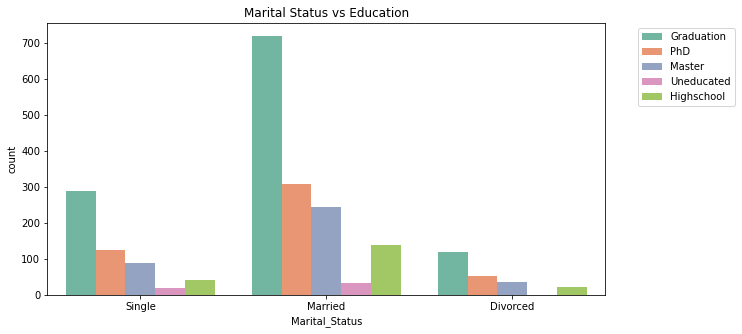

In [25]:
plt.figure(figsize=(10,5))
sns.countplot(x='Marital_Status',data=eda_df,hue='Education',palette='Set2').set(title='Marital Status vs Education')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2 )
plt.savefig('picture/marital_status_vs_education.png')
plt.show()

plotting edukasi terhadap status marriage

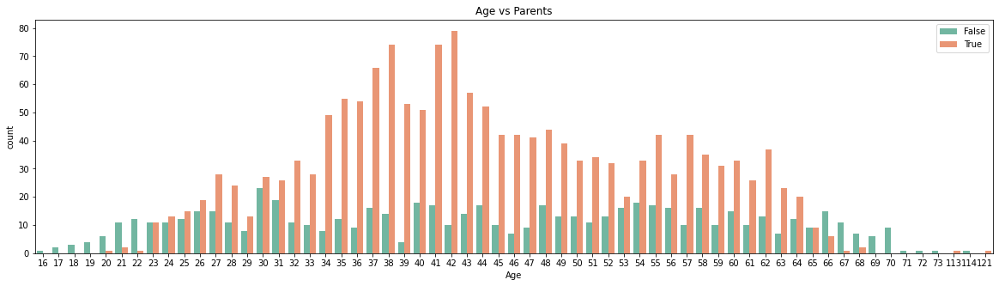

In [26]:
plt.figure(figsize=(20,5))
sns.countplot(x='Age',data=eda_df,hue='Parents',palette='Set2')
plt.legend(loc='upper right')
plt.title('Age vs Parents')
plt.savefig('picture/age_vs_parents.png')
plt.show()

plotting umur dan apakah orang tersebut memiliki anak atau tidak. orang tua termuda di 20 tahun, dataset kebanyakan data dari umur 34 sampai 62 tahun

In [27]:
eda_df.groupby(eda_df['Date Join'].dt.year).sum()['Income']

Date Join
2012    25063616.0
2013    61502804.0
2014    29213489.0
Name: Income, dtype: float64

banyak yang mendaftar pada tahun 2013, sedangkan 2012 dan 2014 tidak terlalu banyak mendaftar ke company

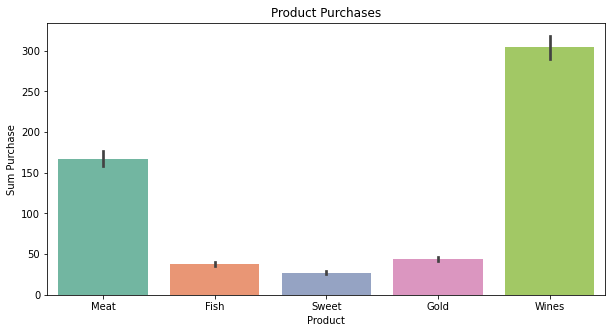

In [28]:
product_purchase = eda_df[['Meat','Fish','Sweet','Gold','Wines']]
plt.figure(figsize=(10,5))
sns.barplot(data=product_purchase,palette='Set2').set(title='Product Purchases',xlabel='Product',ylabel='Sum Purchase')
plt.savefig('picture/product_purchase.png')
plt.show()

produk wines merupakan yang paling banyak dibeli setelah itu daging

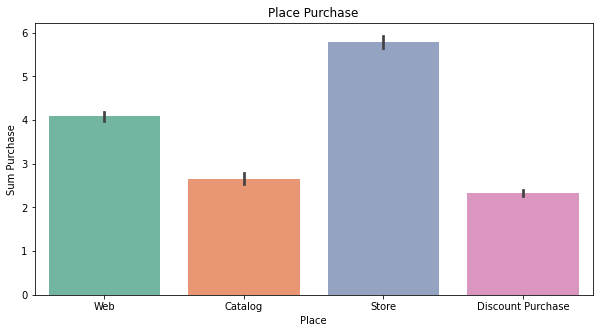

In [29]:
place_purchase = eda_df[['Web','Catalog','Store','Discount Purchase']]
plt.figure(figsize=(10,5))
sns.barplot(data=place_purchase,palette='Set2').set(title='Place Purchase',xlabel='Place',ylabel='Sum Purchase')
plt.savefig('picture/place_purchase.png')
plt.show()

banyak orang yang membeli di store dan cukup banyak juga orang yang berbelanja dengan promo diskon

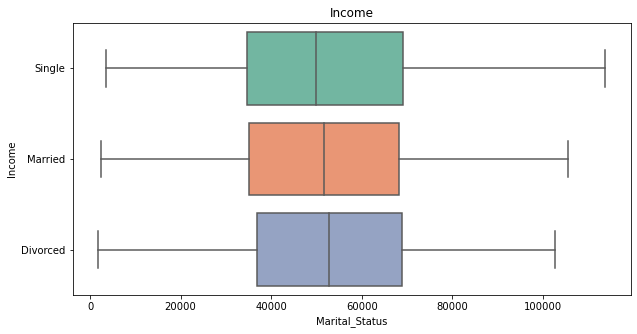

In [30]:
plt.figure(figsize=(10,5))
sns.boxplot(data=eda_df,y='Marital_Status',x='Income',palette='Set2',showfliers = False,orient='h').set(title='Income',xlabel='Marital_Status',ylabel='Income')
plt.savefig('picture/income_vs_marital_status_boxplt.png')
plt.show()

range income berdasarkan status marriage

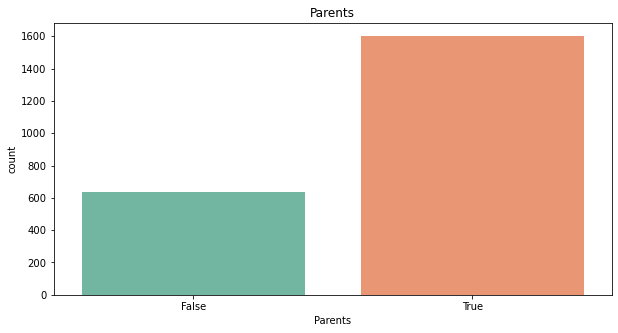

In [31]:
plt.figure(figsize=(10,5))
sns.countplot(x='Parents',data=eda_df,palette='Set2')
plt.title('Parents')
plt.savefig('picture/parents.png')
plt.show()

orang yang menjadi parents lebih banyak yang single/alone

## V. Outlier Handling

Membuat fungsi yang nantinya akan digunakan didalam tabel treatment

In [32]:
# membuat fungsi untuk data yang skew dan dilakukan pencarian batas bawah dan batas atas menggunakan IQR
def iqr(data,column):
    lower_limit= data[column].quantile(0.25) - 3*(data[column].quantile(0.75)-data[column].quantile(0.25))
    upper_limit= data[column].quantile(0.75) + 3*(data[column].quantile(0.75)-data[column].quantile(0.25))
    return lower_limit, upper_limit

# membuat fungsi untuk data yang berdistribusi normal untuk mencari batas atas dan batas bawah menggunakan standard deviasi.
def lcl_ucl_std(data,column):
    lcl = data[column].mean() - 1.5*data[column].std()
    ucl = data[column].mean() + 1.5*data[column].std()
    return lcl,ucl

# membuat fungsi untuk mengetahui berapa banyak persentase outliers untuk masing-masing distribusi yang skewed dan normal. 
# bila tidak terdapat outliers dari kolom tersebut maka nilainya akan menjadi 0
def perc_outliers_iqr(data,column):
    lcl,ucl = iqr(data,column)
    try:
        result = data[column][(data[column]<=lcl) | (data[column]>=ucl)].count()/len(data[column])
    except:
        result = 0
    return result

def perc_outliers_std(data,column):
    lcl,ucl = lcl_ucl_std(data,column)
    try:
        result = data[column][(data[column]<=lcl) | (data[column]>=ucl)].count()/len(data[column])
    except:
        result = 0
    return result
    
# membuat fungsi untuk menyatukan fungsi IQR dan std deviasi. dengan pemilihan fungsi dilihat dari skewness data. 
# apabila diatas -0.5 dan dibawah 0.5 maka data tersebut berdistribusi normal. 
# sedangkan diluar dari nilai tersebut maka data berdistribusi skew
def outliers(data,column,distr):
    if distr <= -0.5 or distr >= 0.5:
        lcl,ucl = iqr(data,column)
        percentage = perc_outliers_iqr(data,column)
    elif distr > -0.5 or distr < 0.5:
        lcl,ucl = lcl_ucl_std(data,column)
        percentage = perc_outliers_std(data,column)
    return lcl,ucl,percentage

### B. Creating Treatment Table

untuk mempermudah kolom mana saja yang skew atau normal dan treatment apa saja yang harus dilakukan, saya membuat tabel treatment yang isi nya adalah kolom-kolom numerik dengan deskripsi sebagai berikut:

|Nama Kolom | Deskripsi |
|---|---|
|name| nama kolom numerik|
| distr| nilai skew distribusi|
|percentage| persentasi jumlah outlier yang diluar dari batas bawah dan batas atas|
|skewness| nama distribusi |
|treatment| treatment yang harus dilakukan|

membuat list dari feature yang masuk kedalam numreical kolom

In [33]:
num_columns = ['ID',
                'Year_Birth',
                'Income',
                'Kidhome',
                'Teenhome',
                'Recency',
                'MntWines',
                'MntFruits',
                'MntMeatProducts',
                'MntFishProducts',
                'MntSweetProducts',
                'MntGoldProds',
                'NumDealsPurchases',
                'NumWebPurchases',
                'NumCatalogPurchases',
                'NumStorePurchases',
                'NumWebVisitsMonth']

kolom feature numerikal yang telah dibuang z cost contact dan z revenue

mengisi tabel outlier treatment dengan memasukannya kedalam variabel.

ada sedikit perbedaan dari batas trimming yang tadinya 5% menjadi 4% karena kolom yang memiliki 4% outlier itu banyak sehingga apabila di trim maka data yang terbuang akan semakin banyak. maka dari itu diputuskan bahwa data diatas 4% akan dilakukan capping saja

In [34]:
# menambah data kolom skew pada kolom numerik data
skew = []
for i in data[num_columns]:
    skew.append(data[i].skew())
# menambah data kolom percentage dengan menggunakan fungsi outliers
percentage = []
j = 0
for i in data[num_columns]:
    percentage.append(outliers(data,i,skew[j])[2])
    j += 1

# pada kolom percentage yang nilainya 0 itu didapatkan dari fungsi outliers. 
# telah dijelaskan pada markdown fungsi oultiers bahwa 0 merupakan tidak ada outliers. 
# nilai percentage outliers dibawah 4% dari kolom data artinya kita bisa membuang data tersebut. 
# nilai percentage outliers diatas 5% sampai 15% dari kolom data artinya kita bisa melakukan capping pada data tersebut.
# nilai percentage outliers diatas 15% dari kolom data artinya kita harus membiarkan data tersetbut. karena bisa jadi ini bukanlah anomali outliers.
treatment = []
j=0
for i in data[num_columns]:
    if percentage[j] == 0:
        treatment.append('No outliers')
    elif percentage[j] <= 0.04:
        treatment.append('trim')
    elif percentage[j] <= 0.15:
        treatment.append('capping')
    elif percentage[j] > 0.15:
        treatment.append('do not treat')
    j += 1

# menambah kolom distribution dengan melihat nilai skewed. 
# bila didalam nilai -0.5 sampai 0.5 maka berdistribusi normal. diluar nilai tersebut maka berdistribusi skewed
distribution = []
j = 0
for i in data[num_columns]:
    if skew[j] >= -0.5 and skew[j] <= 0.5:
        distribution.append('normal')
    else: 
        distribution.append('skewed')
    j += 1

# membuat dataframe dengan variabel outlier_treatment untuk menjadi rangka tabel treatment
outlier_treatment = pd.DataFrame()
outlier_treatment['name'] = data[num_columns].columns
outlier_treatment['distr'] = distribution
outlier_treatment['percentage'] = percentage
outlier_treatment['skewness'] = skew
outlier_treatment['treatment'] = treatment

menampilkan tabel outlier treatment

In [35]:
outlier_treatment

,name,distr,percentage,skewness,treatment
0,ID,normal,0.136771,0.042461,capping
1,Year_Birth,normal,0.127803,-0.350594,capping
2,Income,skewed,0.000448,6.784459,trim
3,Kidhome,skewed,0.000000,0.635865,No outliers
4,Teenhome,normal,0.023318,0.410253,trim
5,Recency,normal,0.134081,-0.002293,capping
6,MntWines,skewed,0.000000,1.180092,No outliers
7,MntFruits,skewed,0.046637,2.104934,capping
8,MntMeatProducts,skewed,0.013004,2.093682,trim
9,MntFishProducts,skewed,0.031839,1.923363,trim


melakukan query kolom yang harus dilakukan treatment capping

In [36]:
outlier_treatment[(outlier_treatment['treatment'] == 'capping')&(outlier_treatment['distr'] == 'skewed')]

,name,distr,percentage,skewness,treatment
7,MntFruits,skewed,0.046637,2.104934,capping
10,MntSweetProducts,skewed,0.047982,2.143733,capping


In [37]:
capping_skew_col = outlier_treatment[(outlier_treatment['treatment'] == 'capping')&(outlier_treatment['distr'] == 'skewed')]['name'].tolist()

dikarenakan semuanya berdistribusi skewed maka winsorizer yang digunakan akan menggunakna method IQR

In [38]:
windsoriser = Winsorizer(capping_method='iqr', # choose iqr for mean and std
                          tail='both', # cap both tails 
                          fold=1.5,
                          variables=capping_skew_col,
                          missing_values='ignore')

windsoriser.fit(data)
data_skew = windsoriser.transform(data)

melihat feature yang harus di capping dan berdistribusi normal

In [39]:
outlier_treatment[(outlier_treatment['treatment'] == 'capping')&(outlier_treatment['distr'] == 'normal')]

,name,distr,percentage,skewness,treatment
0,ID,normal,0.136771,0.042461,capping
1,Year_Birth,normal,0.127803,-0.350594,capping
5,Recency,normal,0.134081,-0.002293,capping
16,NumWebVisitsMonth,normal,0.115695,0.208560,capping


membuat list nama kolom yang akan dicapping

In [40]:
capping_norm_col = outlier_treatment[(outlier_treatment['treatment'] == 'capping')&(outlier_treatment['distr'] == 'normal')]['name'].tolist()

capping normal menggunakan winsorizer metode gaussian

In [41]:
windsoriser = Winsorizer(capping_method='gaussian', # choose iqr for mean and std
                          tail='both', # cap both tails 
                          fold=1.5,
                          variables=capping_norm_col,
                          missing_values='ignore')

windsoriser.fit(data_skew)
data_norm = windsoriser.transform(data_skew)

melihat feature yang harus di trimming dan berdistribusi skewed

In [42]:
outlier_treatment[(outlier_treatment['treatment'] == 'trim')&(outlier_treatment['distr'] == 'skewed')]

,name,distr,percentage,skewness,treatment
2,Income,skewed,0.000448,6.784459,trim
8,MntMeatProducts,skewed,0.013004,2.093682,trim
9,MntFishProducts,skewed,0.031839,1.923363,trim
11,MntGoldProds,skewed,0.021973,1.895299,trim
12,NumDealsPurchases,skewed,0.014350,2.419141,trim
13,NumWebPurchases,skewed,0.001794,1.390803,trim
14,NumCatalogPurchases,skewed,0.001794,1.884183,trim


mengambil nama kolom feature yang harus di trim dan berdistribusi skewed

In [43]:
trim_skew_col = outlier_treatment[(outlier_treatment['treatment'] == 'trim')&(outlier_treatment['distr'] == 'skewed')]['name'].tolist()

melakukan trimming dengan outlier trimmer dengan trimming method IQR karena semua distribusinya skewed

In [44]:
trimmer = OutlierTrimmer(capping_method='iqr',
                        tail= 'both',
                        fold=3,
                        variables=trim_skew_col,
                        missing_values='ignore')

data_trim_norm = trimmer.fit(data_norm)
data_trim_norm = trimmer.transform(data_norm)

melihat feeature yang berdistribusi normal dan harus di trim

In [45]:
outlier_treatment[(outlier_treatment['treatment'] == 'trim')&(outlier_treatment['distr'] == 'normal')]

,name,distr,percentage,skewness,treatment
4,Teenhome,normal,0.023318,0.410253,trim


mengambil nama kolom yang berdistribusi normal dan di dtrim

In [46]:
trim_norm_col = outlier_treatment[(outlier_treatment['treatment'] == 'trim')&(outlier_treatment['distr'] == 'normal')]['name'].tolist()

trimming dengan outlier trimmer dengan metode gaussian 

In [47]:
trimmer = OutlierTrimmer(capping_method='gaussian',
                        tail= 'both',
                        fold=3,
                        variables=trim_norm_col,
                        missing_values='ignore')

data_outlier_clean = trimmer.fit(data_trim_norm)
data_outlier_clean = trimmer.transform(data_trim_norm)

print hasil dari outlier handilng

In [48]:
print('Before Outlier handling:', df_ori.shape)
print('After Outlier handling:', data_outlier_clean.shape)
print(f'Ratio Outlier Handing : {data_outlier_clean.shape[0]/data.shape[0]:.2%}')

Before Outlier handling: (2240, 29)
After Outlier handling: (2075, 29)
Ratio Outlier Handing : 93.05%


sebanyak 93.05% data yang masih dapat digunakan untuk model setelah dilakukan outlier handling

## III. Missing Value Handling

melakukan missing value handling terhadap kolom yang memiliki missing value

In [49]:
data_outlier_clean.isnull().sum()

ID                      0
Year_Birth              0
Education               0
Marital_Status          0
Income                 21
Kidhome                 0
Teenhome                0
Dt_Customer             0
Recency                 0
MntWines                0
MntFruits               0
MntMeatProducts         0
MntFishProducts         0
MntSweetProducts        0
MntGoldProds            0
NumDealsPurchases       0
NumWebPurchases         0
NumCatalogPurchases     0
NumStorePurchases       0
NumWebVisitsMonth       0
AcceptedCmp3            0
AcceptedCmp4            0
AcceptedCmp5            0
AcceptedCmp1            0
AcceptedCmp2            0
Complain                0
Z_CostContact           0
Z_Revenue               0
Response                0
dtype: int64

melihat missing value pada feature income

In [50]:
data_outlier_clean[data_outlier_clean['Income'].isnull() == True]

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
10,1994.000000,1983.000000,Graduation,Married,NaN,1,0,15-11-2013,11.000000,5,...,7.000000,0,0,0,0,0,0,3,11,0
43,7281.000000,1959.000000,PhD,Single,NaN,0,0,05-11-2013,80.000000,81,...,2.000000,0,0,0,0,0,0,3,11,0
48,7244.000000,1951.000000,Graduation,Single,NaN,2,1,01-01-2014,92.530586,48,...,6.000000,0,0,0,0,0,0,3,11,0
58,8557.000000,1982.000000,Graduation,Single,NaN,1,0,17-06-2013,57.000000,11,...,6.000000,0,0,0,0,0,0,3,11,0
71,10454.821219,1973.000000,2n Cycle,Married,NaN,1,0,14-09-2012,25.000000,25,...,8.000000,0,0,0,0,0,0,3,11,0
91,9235.000000,1957.000000,Graduation,Single,NaN,1,1,27-05-2014,45.000000,7,...,7.000000,0,0,0,0,0,0,3,11,0
92,5798.000000,1973.000000,Master,Together,NaN,0,0,23-11-2013,87.000000,445,...,1.678591,0,0,0,0,0,0,3,11,0
128,8268.000000,1961.000000,PhD,Married,NaN,0,1,11-07-2013,23.000000,352,...,6.000000,0,0,0,0,0,0,3,11,0
133,1295.000000,1963.000000,Graduation,Married,NaN,0,1,11-08-2013,92.530586,231,...,4.000000,0,0,0,0,0,0,3,11,0
312,2437.000000,1986.787067,Graduation,Married,NaN,0,0,03-06-2013,69.000000,861,...,3.000000,0,1,0,1,0,0,3,11,0


dilihat distribusi income untuk menentukan harus diapakan missing valuenya

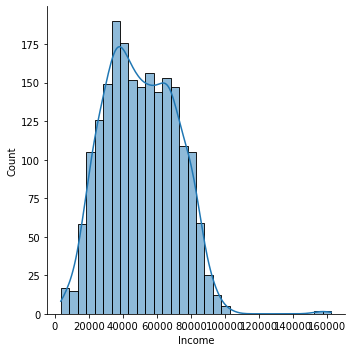

In [51]:
sns.displot(data_outlier_clean['Income'],kde=True)

diputuskan akan dilakukan imputasi pada missing value income dangan metode median karena berdistribusi skew

In [52]:
from sklearn.impute import SimpleImputer
imputer = SimpleImputer(missing_values=np.nan, strategy='median')
income = imputer.fit_transform(data_outlier_clean[['Income']])

memasukan data impute kedalam kolom income

In [53]:
data_clean = data_outlier_clean.copy()
data_clean['Income'] = income

melihat kembali data yang missing

In [54]:
data_clean.isnull().sum()

ID                     0
Year_Birth             0
Education              0
Marital_Status         0
Income                 0
Kidhome                0
Teenhome               0
Dt_Customer            0
Recency                0
MntWines               0
MntFruits              0
MntMeatProducts        0
MntFishProducts        0
MntSweetProducts       0
MntGoldProds           0
NumDealsPurchases      0
NumWebPurchases        0
NumCatalogPurchases    0
NumStorePurchases      0
NumWebVisitsMonth      0
AcceptedCmp3           0
AcceptedCmp4           0
AcceptedCmp5           0
AcceptedCmp1           0
AcceptedCmp2           0
Complain               0
Z_CostContact          0
Z_Revenue              0
Response               0
dtype: int64

data telah selesai dilakukan cleaning

## V Feature Selection

dilakukan data cleaning untuk membuang feature yang high cardinality ataupun feature yang tidak berguna

dikarenakan ID memiliki high cardinality maka akan di drop

kemudain Z_CostContact dan Z_Revenue hanya memiliki 1 kategori maka akan di drop

In [55]:
data_cleaning = data_clean.drop(['ID','Z_CostContact', 'Z_Revenue'],axis=1)

dipisahkan setiap kolom berdistribusi skew dan berdistribusi normal


In [56]:
num_columns_skew = ['Income', 'Kidhome', 'MntWines', 'MntFruits', 'MntMeatProducts',
                     'MntFishProducts', 'MntSweetProducts', 'MntGoldProds',
                     'NumDealsPurchases', 'NumWebPurchases', 'NumCatalogPurchases',
                     'NumStorePurchases']
num_columns_norm = [ 'Year_Birth', 'Teenhome', 'Recency', 'NumWebVisitsMonth']


untuk kolom kategorikal tidak akandimasukan kedalam model clustering karena kolom tersebut akan membingungkan model untuk mengcluster

In [57]:
data_cleaning = data_clean[num_columns_skew + num_columns_norm]

## IV. Feature Scaling & Encoding

dilakukan scaling pada kolom numerical menggunakan Minmax scaler karena semua data numerical berdistribusi skew kemudian dilakukan normalisasi agar model mudah melakukan clustering

In [58]:
scaler_skew = MinMaxScaler()
num_columns_skew_scaled = scaler_skew.fit_transform(data_cleaning[num_columns_skew])
normalyzer = Normalizer()
num_columns_norm_normalyzer = normalyzer.fit_transform(num_columns_skew_scaled)
num_columns_normalyzer = pd.DataFrame(num_columns_norm_normalyzer, columns=num_columns_skew)
num_columns_normalyzer


,Income,Kidhome,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases
0,0.149653,0.000000,0.185110,0.435228,0.272204,0.396080,0.435228,0.194416,0.145076,0.316529,0.395662,0.133916
1,0.419184,0.777347,0.011455,0.019194,0.010685,0.016452,0.019194,0.047351,0.345487,0.141336,0.141336,0.239184
2,0.284138,0.000000,0.189135,0.400990,0.096430,0.389299,0.171853,0.141321,0.073651,0.482081,0.120520,0.509893
3,0.215659,0.740303,0.010909,0.073116,0.033920,0.078339,0.054837,0.037579,0.329024,0.269201,0.000000,0.455571
4,0.267538,0.387933,0.089903,0.411880,0.104871,0.188835,0.258622,0.059076,0.431037,0.352667,0.211600,0.358092
...,...,...,...,...,...,...,...,...,...,...,...,...
2070,0.335054,0.860934,0.003460,0.063773,0.013806,0.054662,0.042515,0.078664,0.191319,0.156533,0.000000,0.264903
2071,0.239111,0.627869,0.170740,0.000000,0.021576,0.000000,0.000000,0.025497,0.488342,0.456632,0.114158,0.241488
2072,0.233293,0.000000,0.421555,0.410756,0.172295,0.117359,0.102689,0.084445,0.077017,0.126028,0.189041,0.693152
2073,0.291977,0.000000,0.202299,0.261364,0.172985,0.298701,0.261364,0.218511,0.156818,0.384917,0.320764,0.542832


melakukan scaling dengan menggunakan standard scaler untuk data yang berdistribusi normal

In [59]:
scaler_norm = StandardScaler()
num_columns_norm_scaled = scaler_norm.fit_transform(data_cleaning[num_columns_norm])
num_columns_norm_scaled = pd.DataFrame(num_columns_norm_scaled, columns=num_columns_norm)
num_columns_norm_scaled

,Year_Birth,Teenhome,Recency,NumWebVisitsMonth
0,-1.078143,-0.952704,0.312617,0.719364
1,-1.350263,0.891383,-0.395691,-0.207909
2,-0.352491,-0.952704,-0.820676,-0.671546
3,1.370935,-0.952704,-0.820676,0.255727
4,1.098815,-0.952704,1.535531,-0.207909
...,...,...,...,...
2070,0.463869,-0.952704,1.127171,0.719364
2071,-1.640165,0.891383,0.241786,0.719364
2072,1.098815,-0.952704,1.481325,0.255727
2073,-1.168850,0.891383,-1.458153,-1.135182


hasil dari encoding dan scaling

In [60]:
data_scale_encode = pd.concat([num_columns_normalyzer,num_columns_norm_scaled], axis=1)
data_scale_encode

,Income,Kidhome,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases,Year_Birth,Teenhome,Recency,NumWebVisitsMonth
0,0.149653,0.000000,0.185110,0.435228,0.272204,0.396080,0.435228,0.194416,0.145076,0.316529,0.395662,0.133916,-1.078143,-0.952704,0.312617,0.719364
1,0.419184,0.777347,0.011455,0.019194,0.010685,0.016452,0.019194,0.047351,0.345487,0.141336,0.141336,0.239184,-1.350263,0.891383,-0.395691,-0.207909
2,0.284138,0.000000,0.189135,0.400990,0.096430,0.389299,0.171853,0.141321,0.073651,0.482081,0.120520,0.509893,-0.352491,-0.952704,-0.820676,-0.671546
3,0.215659,0.740303,0.010909,0.073116,0.033920,0.078339,0.054837,0.037579,0.329024,0.269201,0.000000,0.455571,1.370935,-0.952704,-0.820676,0.255727
4,0.267538,0.387933,0.089903,0.411880,0.104871,0.188835,0.258622,0.059076,0.431037,0.352667,0.211600,0.358092,1.098815,-0.952704,1.535531,-0.207909
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2070,0.335054,0.860934,0.003460,0.063773,0.013806,0.054662,0.042515,0.078664,0.191319,0.156533,0.000000,0.264903,0.463869,-0.952704,1.127171,0.719364
2071,0.239111,0.627869,0.170740,0.000000,0.021576,0.000000,0.000000,0.025497,0.488342,0.456632,0.114158,0.241488,-1.640165,0.891383,0.241786,0.719364
2072,0.233293,0.000000,0.421555,0.410756,0.172295,0.117359,0.102689,0.084445,0.077017,0.126028,0.189041,0.693152,1.098815,-0.952704,1.481325,0.255727
2073,0.291977,0.000000,0.202299,0.261364,0.172985,0.298701,0.261364,0.218511,0.156818,0.384917,0.320764,0.542832,-1.168850,0.891383,-1.458153,-1.135182


## IV. Variance Inflation Factor

Uji multikolinearitas dilakukan dengan tujuan untuk mengetahui apakah pada suatu model regresi ditemukan adanya korelasi antar variabel independent. Pengujian multikolinearitas bertujuan untuk mengetahui apakah model regresi ditemukan adanya korelasi antar variabel independent/ atau variable bebas (Ghozali, 2016).

Untuk menemukan terdapat atau tidaknya multikolinearitas pada model regresi dapat diketahui dari nilai toleransi dan nilai variance inflation factor (VIF). Nilai Tolerance mengukur variabilitas dari variabel bebas yang terpilih yang tidak dapat dijelaskan oleh variabel bebas lainnya. Jadi nilai tolerance rendah sama dengan nilai VIF tinggi, dikarenakan VIF = 1/tolerance, dan menunjukkan terdapat kolinearitas yang tinggi. Nilai cut off yang digunakan adalah untuk nilai tolerance 0,10 atau nilai VIF diatas angka 10. (Meriyani, 2021)

Pengujian dapat dilakukan dengan melihat nilai Tolerance dan Variance Inflation Factor (VIF) pada model regresi. Kriteria pengambilan keputusan terkait uji multikolinearitas adalah sebagai berikut (Ghozali, 2016) :

- Jika nilai VIF < 10 atau nilai Tolerance > 0,01, maka dinyatakan tidak terjadi multikolinearitas.
- Jika nilai VIF > 10 atau nilai Tolerance < 0,01, maka dinyatakan terjadi multikolinearitas.
- Jika koefisien korelasi masing-masing variabel bebas > 0,8 maka terjadi multikolinearitas. Tetapi jika koefisien korelasi masing-masing variabel bebas < 0,8 maka tidak terjadi multikolinearitas.


namun pada kasus kali ini deklarasi nilai multikolinearitas adalah sebagai berikut
- Jika nilai VIF < 5 atau nilai Tolerance > 0,05, maka dinyatakan tidak terjadi multikolinearitas.
- Jika nilai VIF > 5 atau nilai Tolerance < 0,05, maka dinyatakan terjadi multikolinearitas.

membuat dataframe VIF untuk membuat tabel VIF

In [61]:
vif_data = pd.DataFrame()
vif_data['name'] = data_scale_encode.columns
vif_data['vif'] = [variance_inflation_factor(data_scale_encode.values, i) for i in range(len(data_scale_encode.columns))]

dilakukan variance inflation factor dengan menggunakan statsmodels

ditampilkan tabel VIF dengan sort by nilai VIF

In [62]:
vif_data.sort_values(by='vif', ascending=False)

,name,vif
11,NumStorePurchases,10.908165
0,Income,8.188687
9,NumWebPurchases,8.132494
8,NumDealsPurchases,6.397206
10,NumCatalogPurchases,5.116506
4,MntMeatProducts,4.438195
2,MntWines,4.386794
6,MntSweetProducts,3.399100
3,MntFruits,3.079289
5,MntFishProducts,2.927187


diambil feature yang nilai VIF dibawah 5 maka ada 11 feature + 1 yang akan diambil

In [63]:
pca = PCA(n_components=12)
data_reduced = pca.fit_transform(data_scale_encode)

plotting untuk melihat informasi yang masih diretain setelah feature direduksi

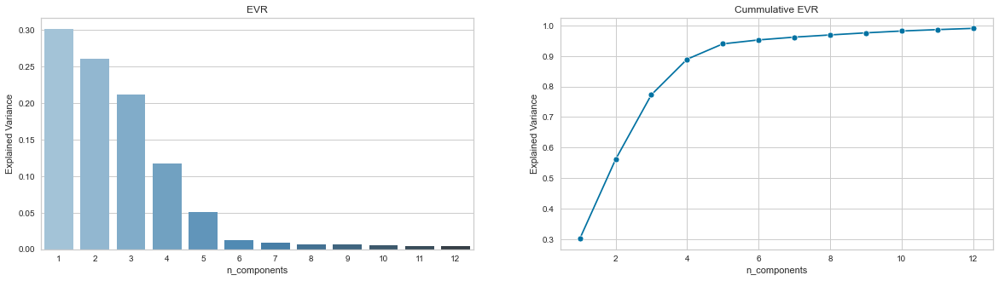

In [127]:
fig,ax = plt.subplots(1,2,figsize=(20,5))

sns.barplot(x=list(range(1,(len(pca.explained_variance_ratio_)+1))), 
            y=pca.explained_variance_ratio_,
            ax=ax[0],
            palette='Blues_d'         
            ).set(xlabel='n_components', 
                    ylabel='Explained Variance',
                    title='EVR')

sns.lineplot(x=list(range(1,(len(pca.explained_variance_ratio_)+1))), 
            y=np.cumsum(pca.explained_variance_ratio_),
            marker='o',
            ax=ax[1],     
            ).set(xlabel='n_components',
                    ylabel='Explained Variance',
                    title='Cummulative EVR')
plt.savefig('picture/cummulative_evr.JPG')
plt.show()

hasilnya adalah dengan reduksi sampai 12 feature didapatkan hasil informasi yang di retain hingga +- 100%

### PCA 2D

Dataset dilakukan reduksi hingga 2 feature dengan pca untuk dilihat visualisasi scatter 2dimensi nya

In [65]:
pca_2d = PCA(n_components=2)
data_pca = pca_2d.fit_transform(data_reduced)

melihat data yang telah direduksi hingga 2 dimensi

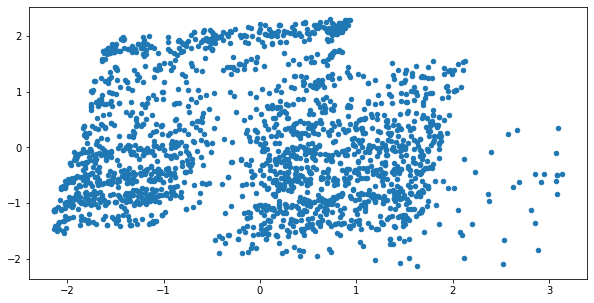

In [66]:
plt.figure(figsize=(10,5))
plt.scatter(data_pca[:,0], data_pca[:,1],marker='o', s=20)
plt.show()

## V. Model Definition

### Model K Means

mencari jumlah cluster yang baik dengan menggunakan elbow method k-means

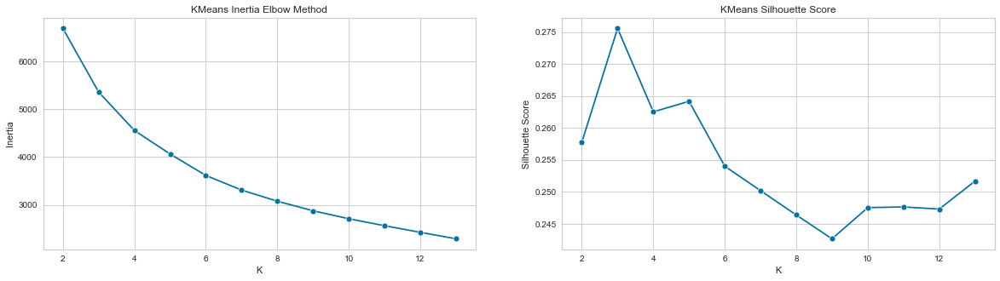

In [126]:
k=[2,3,4,5,6,7,8,9,10,11,12,13]
k_means_per_k = [KMeans(n_clusters=i).fit(data_reduced) for i in k]

inertia= [k_means_per_k[i].inertia_ for i in range(len(k_means_per_k))]
s_score= [silhouette_score(data_reduced, k_means_per_k[i].labels_) for i in range(len(k_means_per_k))]

fig,ax = plt.subplots(1,2,figsize=(20,5))
sns.lineplot(x=k,y=inertia,marker='o',ax=ax[0]).set(xlabel='K',ylabel='Inertia',title='KMeans Inertia Elbow Method')
sns.lineplot(x=k,y=s_score,marker='o',ax=ax[1]).set(xlabel='K',ylabel='Silhouette Score',title='KMeans Silhouette Score')
plt.savefig('picture/kmeans/KMeans_Elbow_Method.JPG')
plt.show()


dicoba juga melihat score elbow dengan menggunakan libarary KElbowVisualizer

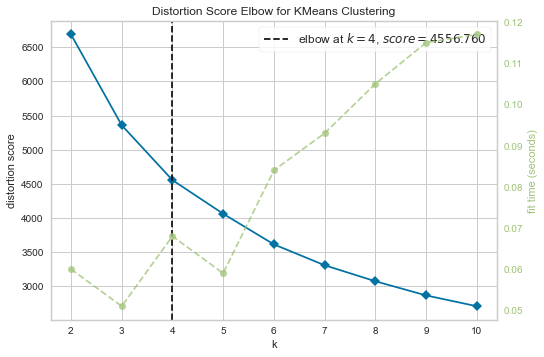

<AxesSubplot:title={'center':'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [68]:
from yellowbrick.cluster import KElbowVisualizer
elbow_m = KElbowVisualizer(KMeans(), k=10)
elbow_m.fit(data_reduced)
elbow_m.show()

dari KElbow visualizer jumlah cluster optimum adalah 4 namun dilihat lagi dari silhouette score mana yg paling baik memisahkan cluster

melakukan visualisasi shiluette score

In [69]:
def plot_shilouette(range_n_clusters,X):
    for n_clusters in range_n_clusters:
        # Create a subplot with 1 row and 2 columns
        fig, ax1 = plt.subplots(1, 1, figsize=(10, 5))
        fig.set_size_inches(10, 6)

        # The 1st subplot is the silhouette plot
        # The silhouette coefficient can range from -1, 1 but in this example all
        # lie within [-0.1, 1]
        ax1.set_xlim([-0.1, 1])
        # The (n_clusters+1)*10 is for inserting blank space between silhouette
        # plots of individual clusters, to demarcate them clearly.
        ax1.set_ylim([0, len(X) + (n_clusters + 1) * 10])

        # Initialize the clusterer with n_clusters value and a random generator
        # seed of 10 for reproducibility.
        clusterer = KMeans(n_clusters=n_clusters, random_state=5)
        cluster_labels = clusterer.fit_predict(X)

        # The silhouette_score gives the average value for all the samples.
        # This gives a perspective into the density and separation of the formed
        # clusters

        # Compute the silhouette scores for each sample
        sample_silhouette_values = silhouette_samples(X, cluster_labels)

        y_lower = 10
        for i in range(n_clusters):
            # Aggregate the silhouette scores for samples belonging to
            # cluster i, and sort them
            ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]

            ith_cluster_silhouette_values.sort()

            size_cluster_i = ith_cluster_silhouette_values.shape[0]
            y_upper = y_lower + size_cluster_i

            color = cm.nipy_spectral(float(i) / n_clusters)
            ax1.fill_betweenx(
                np.arange(y_lower, y_upper),
                0,
                ith_cluster_silhouette_values,
                facecolor=color,
                edgecolor=color,
                alpha=0.7,
            )

            # Label the silhouette plots with their cluster numbers at the middle
            ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

            # Compute the new y_lower for next plot
            y_lower = y_upper + 10  # 10 for the 0 samples

        ax1.set_title("The silhouette plot for the various clusters.")
        ax1.set_xlabel("The silhouette coefficient values")
        ax1.set_ylabel("Cluster label")


        # The vertical line for average silhouette score of all the values
        silhouette_avg = silhouette_score(X, cluster_labels)
        ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

        ax1.set_yticks([])  # Clear the yaxis labels / ticks
        ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])
        plt.suptitle(
            "Silhouette analysis for KMeans clustering on sample data with n_clusters = %d"
            % n_clusters,
            fontsize=14,
            fontweight="bold",
        )
        plt.savefig('picture/kmeans/silhouette_analysis_%d.png' % n_clusters)
        
    plt.show()

memanggil fungsi plotting shilhouette untuk k-means

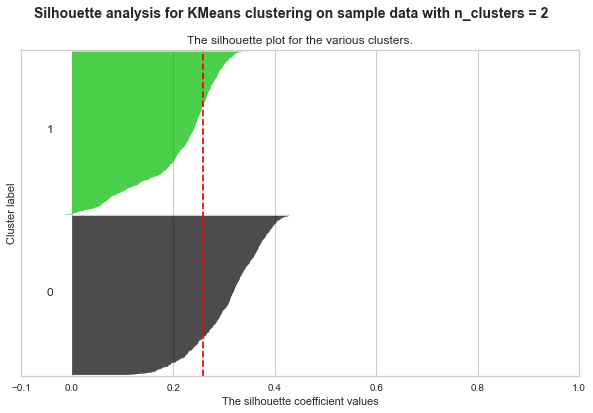

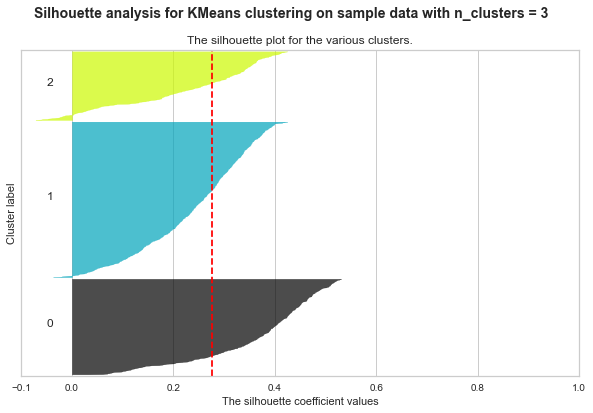

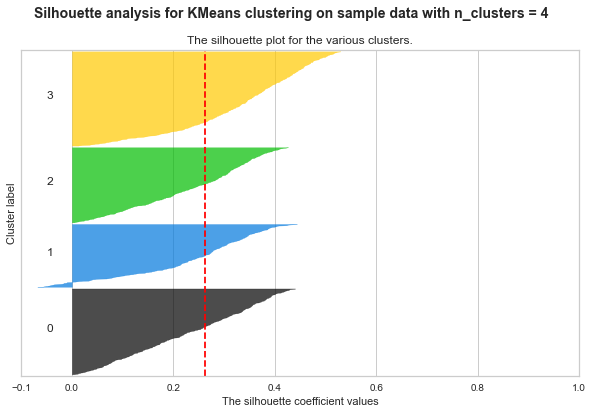

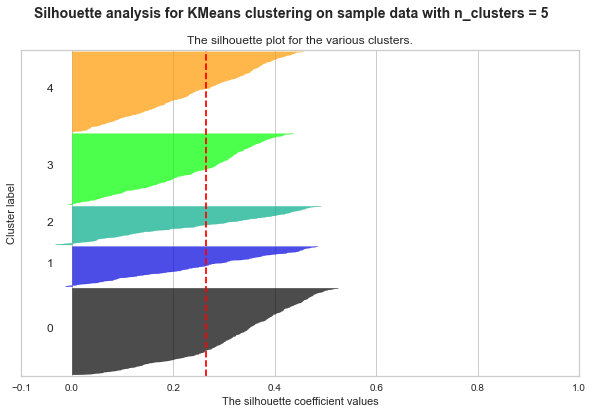

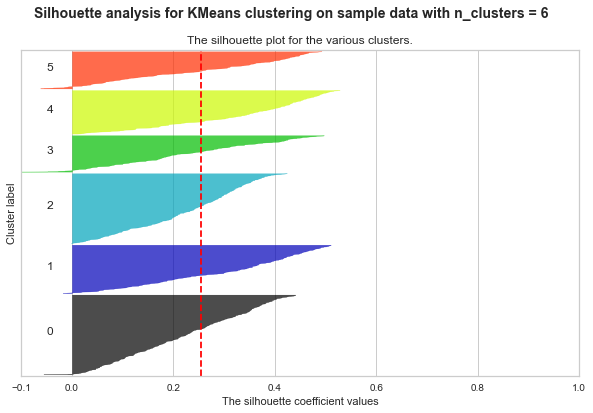

...

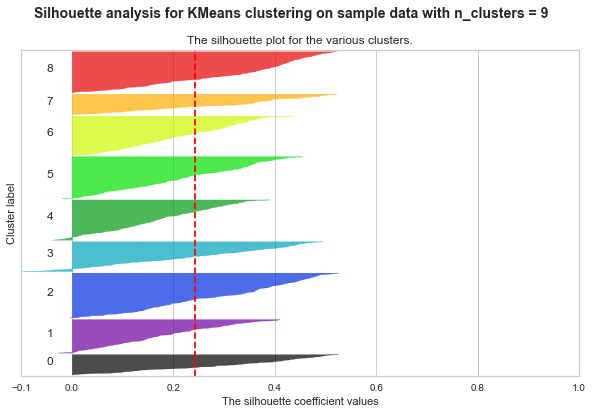

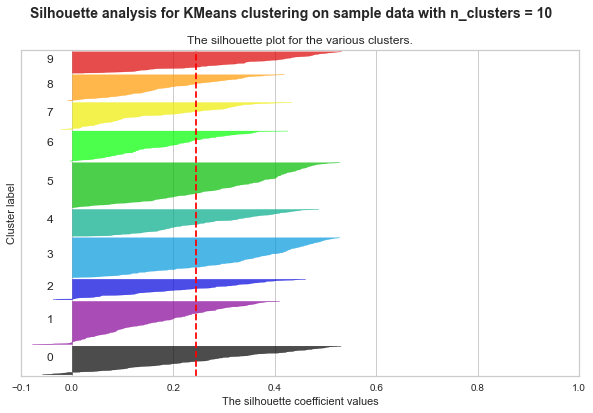

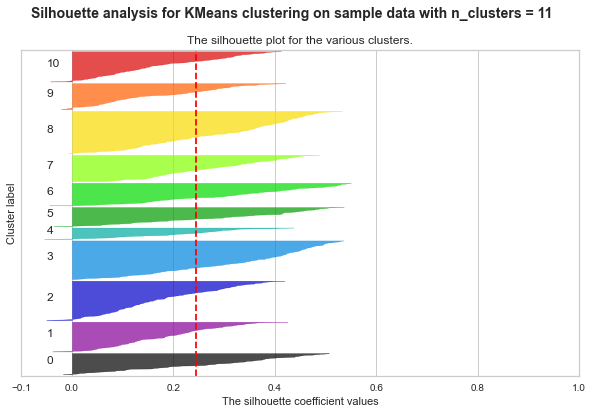

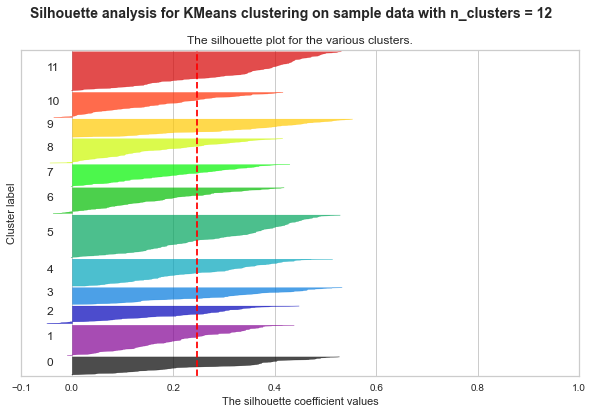

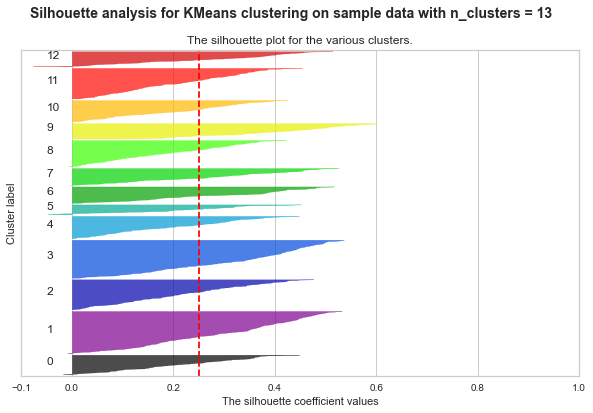

In [70]:
plot_shilouette(k,data_reduced)

dapata dilihat sihouette semua n_cluster memenuhi kriteria untuk menjadi kluster terbaik. 

kemudian plotting scatter dari label tiap jumlah cluster yang dibuat

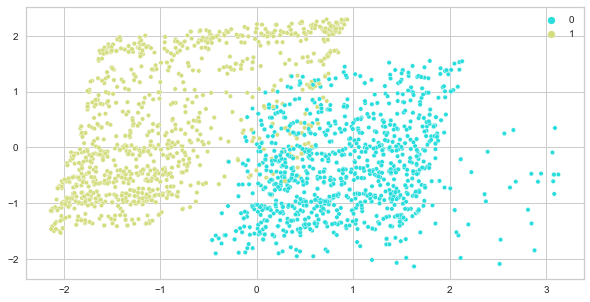

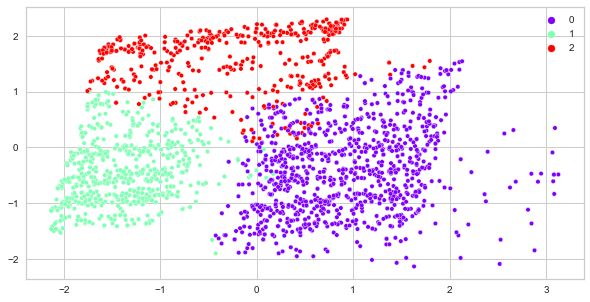

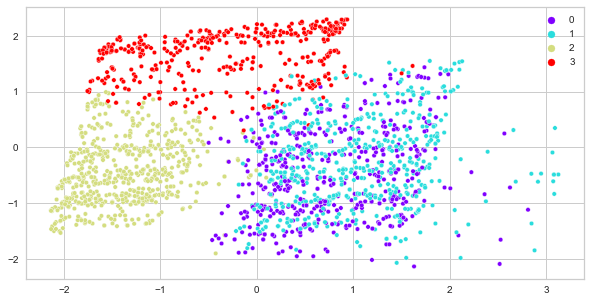

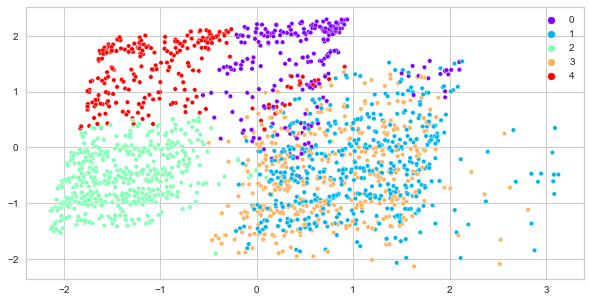

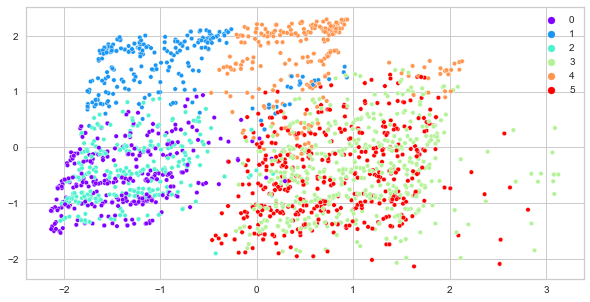

...

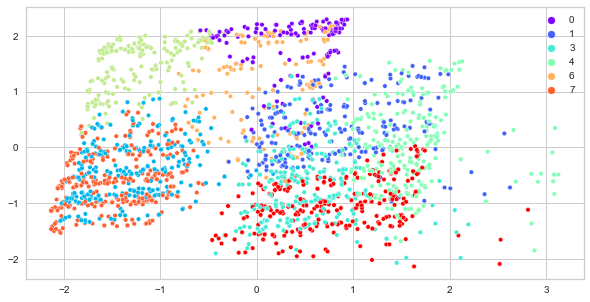

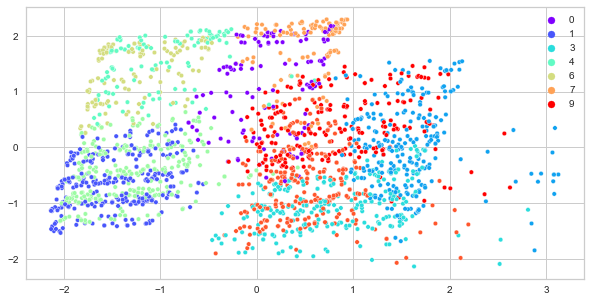

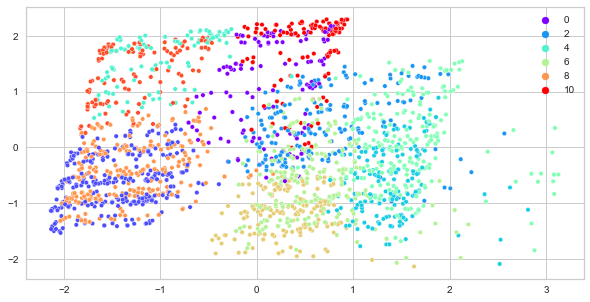

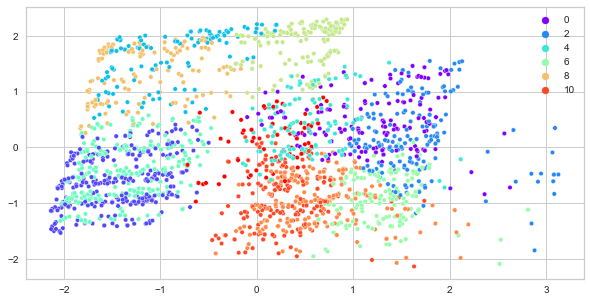

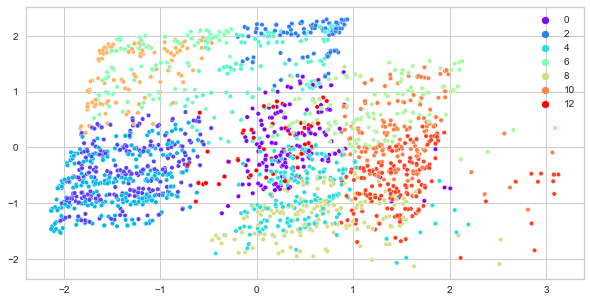

In [71]:
j=0
for i in range(len(k_means_per_k)):
    plt.figure(figsize=(10,5))
    sns.scatterplot(data_pca[:,0],data_pca[:,1],marker='o',s=20,hue=k_means_per_k[j].labels_,palette='rainbow')
    plt.savefig('picture/kmeans/kmeans_%d.png' % i)
    j+=1
plt.show()

karena silhouette scoer terbaik adalah 3 mkaak dibuat model n_cluster =3 

In [72]:
best_kmeans = KMeans(n_clusters=3,random_state=5).fit(data_reduced)
labels_kmeans = best_kmeans.labels_

# Number of clusters in labels_kmeans, ignoring noise if present.
n_clusters_ = len(set(labels_kmeans)) - (1 if -1 in labels_kmeans else 0)
n_noise_ = list(labels_kmeans).count(-1)

print("Estimated number of clusters    : %d" % n_clusters_)
print("Estimated number of noise points: %d" % n_noise_)
print("Silhouette Coefficient          : %0.3f" % metrics.silhouette_score(data_reduced, labels_kmeans))
print('Calinski and Harabasz Index     : %0.3f' % metrics.calinski_harabasz_score(data_reduced, labels_kmeans))
print('Davis Bouldin Index             : %0.3f' % metrics.davies_bouldin_score(data_reduced, labels_kmeans))

Estimated number of clusters    : 3
Estimated number of noise points: 0
Silhouette Coefficient          : 0.276
Calinski and Harabasz Index     : 701.861
Davis Bouldin Index             : 1.347


didapatakn hasil silhouette coeff 0.276 dan jumlah cluster 3

### Model DBscan

melakukan pencarian jumlah cluster terbaik dbscan dengan mengubah epsilon

In [73]:
eps_dbscan = [0.3,0.4,0.5,0.6,0.7,0.8,0.9,1]
s_score_dbscan = [metrics.silhouette_score(data_reduced, DBSCAN(eps=i,min_samples=5).fit_predict(data_reduced)) for i in eps_dbscan]

melakukan plotting silhouette score pada dbscan

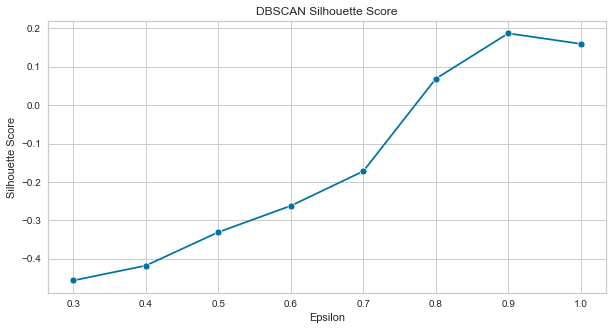

In [74]:
plt.figure(figsize=(10,5))
sns.lineplot(x=eps_dbscan,y=s_score_dbscan,marker='o').set(xlabel='Epsilon',ylabel='Silhouette Score')
plt.title('DBSCAN Silhouette Score')
plt.savefig('picture/dbscan/silhouette_score_dbscan.png')
plt.show()

didapatakn skor terbaik pada epsilon 0.9

kemudian membuat fungsi visualisasi

In [75]:
def plot_dbscan(dbscan, X, size, show_xlabels=True, show_ylabels=True):
    core_mask = np.zeros_like(dbscan.labels_, dtype=bool)
    core_mask[dbscan.core_sample_indices_] = True
    anomalies_mask = dbscan.labels_ == -1
    non_core_mask = ~(core_mask | anomalies_mask)

    cores = dbscan.components_
    anomalies = X[anomalies_mask]
    non_cores = X[non_core_mask]
    
    plt.figure(figsize=(10, 5))
    plt.scatter(cores[:, 0], cores[:, 1],
                c=dbscan.labels_[core_mask], marker='o', s=size, cmap="Paired")
    plt.scatter(cores[:, 0], cores[:, 1], marker='v', s=20, c=dbscan.labels_[core_mask])
    plt.scatter(anomalies[:, 0], anomalies[:, 1],
                c="black", s=1)
    plt.scatter(non_cores[:, 0], non_cores[:, 1], c=dbscan.labels_[non_core_mask], marker=".")
    if show_xlabels:
        plt.xlabel("$x_1$", fontsize=14)
    else:
        plt.tick_params(labelbottom=False)
    if show_ylabels:
        plt.ylabel("$x_2$", fontsize=14, rotation=0)
    else:
        plt.tick_params(labelleft=False)
    plt.title("eps={:.2f}, min_samples={}".format(dbscan.eps, dbscan.min_samples), fontsize=14)
    plt.savefig('picture/dbscan/dbscan_%d.png' % i)

print visualisasi setiap kombinasi epsilon

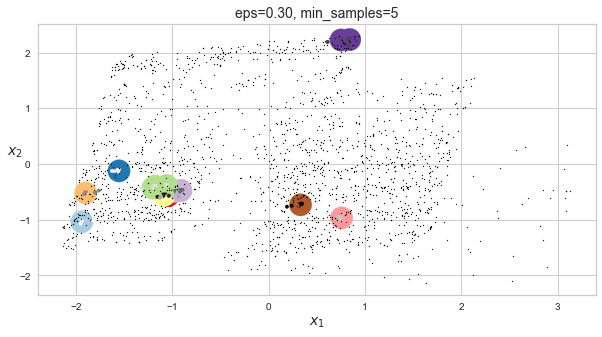

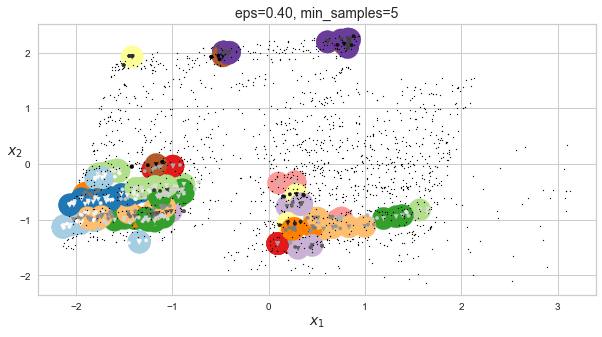

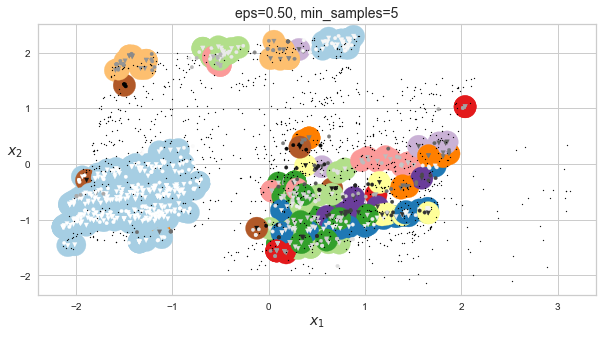

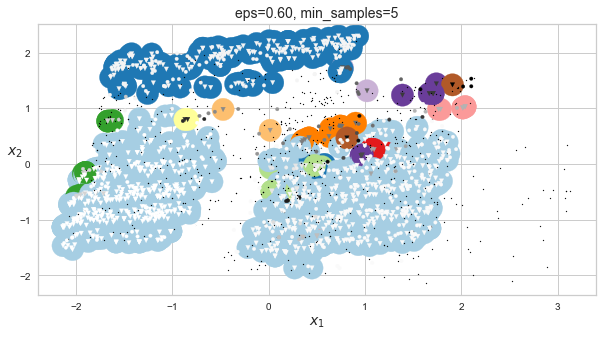

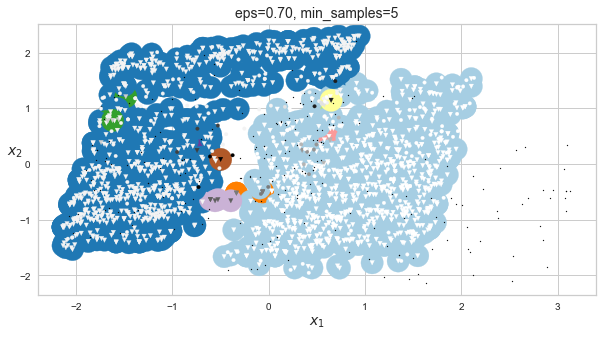

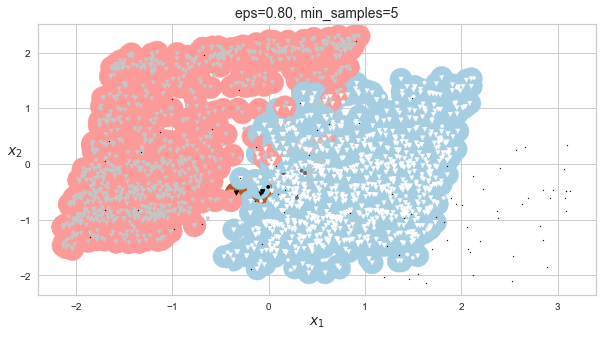

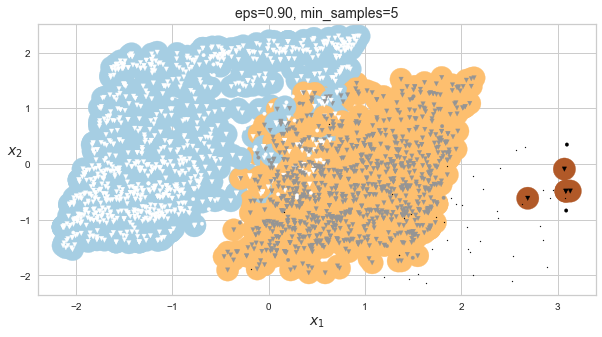

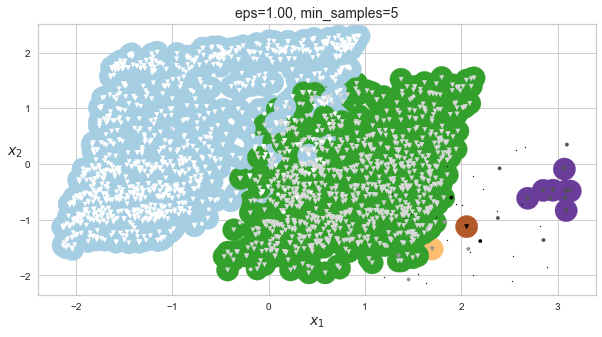

In [76]:
j=0
for i in range(len(eps_dbscan)):
    clusterer = DBSCAN(eps=eps_dbscan[j], min_samples=5).fit(data_reduced)
    plot_dbscan(clusterer,data_pca,size=500)
    j+=1

karena tidak ada yang bagus dengan model dbscan maka diambil random epsilon 0.9

In [77]:
best_dbscan = DBSCAN(eps=0.9, min_samples=5)

print summary dari dbscan

In [78]:
labels_true = best_dbscan.fit_predict(data_reduced)
labels = best_dbscan.labels_

# Number of clusters in labels, ignoring noise if present.
n_clusters_ = len(set(labels)) - (1 if -1 in labels else 0)
n_noise_ = list(labels).count(-1)

print("Estimated number of clusters    : %d" % n_clusters_)
print("Estimated number of noise points: %d" % n_noise_)
print("Homogeneity                     : %0.3f" % metrics.homogeneity_score(labels_true, labels))
print("Completeness                    : %0.3f" % metrics.completeness_score(labels_true, labels))
print("V-measure                       : %0.3f" % metrics.v_measure_score(labels_true, labels))
print("Adjusted Rand Index             : %0.3f" % metrics.adjusted_rand_score(labels_true, labels))
print("Adjusted Mutual Information     : %0.3f" % metrics.adjusted_mutual_info_score(labels_true, labels))
print("Silhouette Coefficient          : %0.3f" % metrics.silhouette_score(data_pca, labels))
print('Calinski and Harabasz Index     : %0.3f' % metrics.calinski_harabasz_score(data_pca, labels))
print('Davis Bouldin Index             : %0.3f' % metrics.davies_bouldin_score(data_pca, labels))

Estimated number of clusters    : 3
Estimated number of noise points: 42
Homogeneity                     : 1.000
Completeness                    : 1.000
V-measure                       : 1.000
Adjusted Rand Index             : 1.000
Adjusted Mutual Information     : 1.000
Silhouette Coefficient          : 0.252
Calinski and Harabasz Index     : 488.145
Davis Bouldin Index             : 1.215


didapatakan silhouette coeff 0.252 dan jumlah kluster terbaik 3

### Model Agglomerative Clustering

mencari jumlah cluster yang terbaik untuk agglomerative clustering dengan mengubah n_cluster

In [79]:
n_aglo = [2,3,4,5,6,7,8,9,10,11,12,13]
aglo_per_k = [AgglomerativeClustering(n_clusters=i).fit(data_reduced) for i in n_aglo]
s_score_aglo = [silhouette_score(data_reduced, aglo_per_k[i].labels_) for i in range(len(aglo_per_k))]

visualisasi dari silhouette score untuk tiap n_cluster yang berbeda

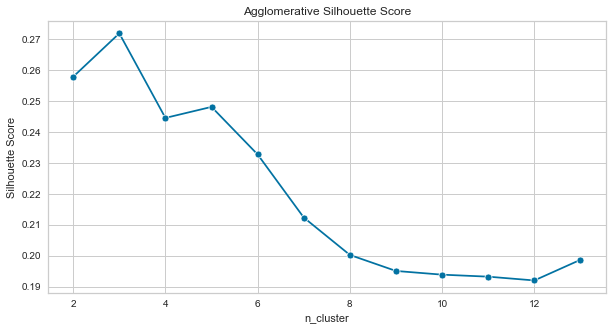

In [80]:
plt.figure(figsize=(10,5))
sns.lineplot(x=n_aglo,y=s_score_aglo,marker='o').set(xlabel='n_cluster',ylabel='Silhouette Score')
plt.title('Agglomerative Silhouette Score')
plt.savefig('picture/agglomerative/silhouette_score_agglomerative.png')
plt.show()

melakukan visualisasi label kepada cluster sesuai dengan jumlah label cluster yang dibuat pada model sebelumnya

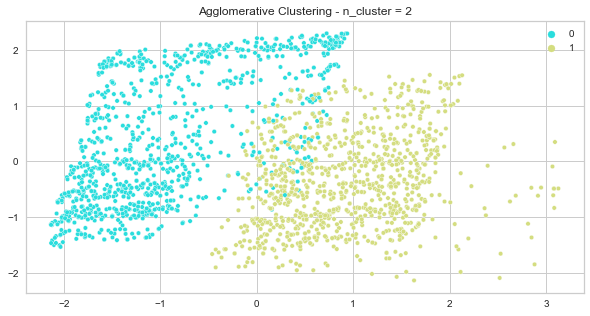

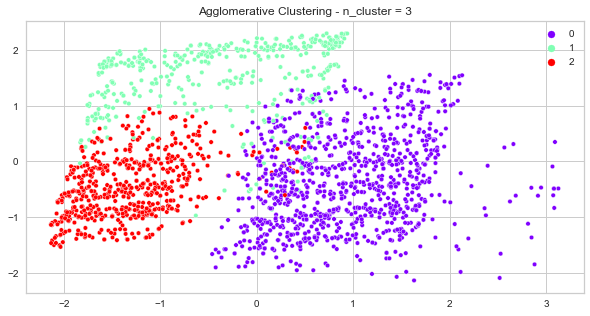

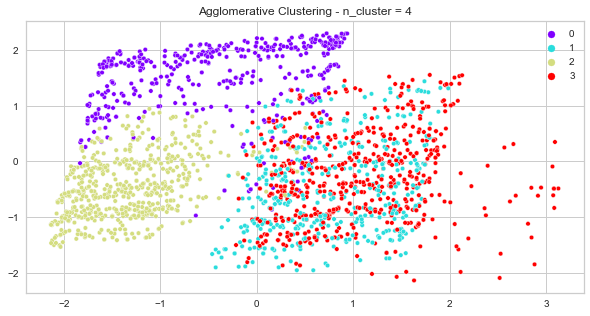

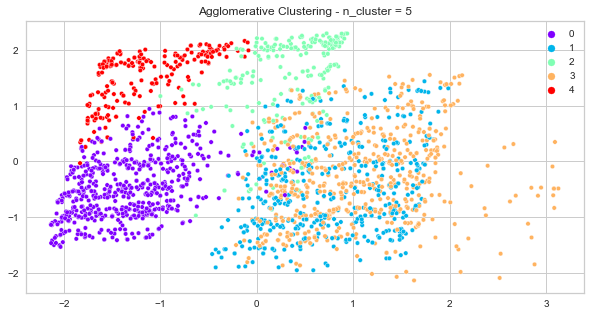

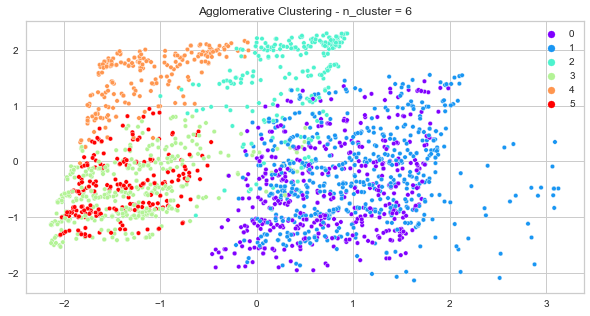

...

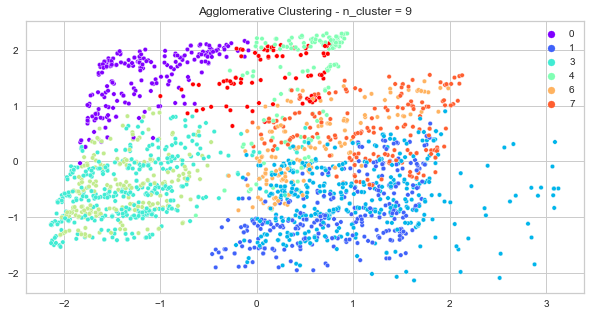

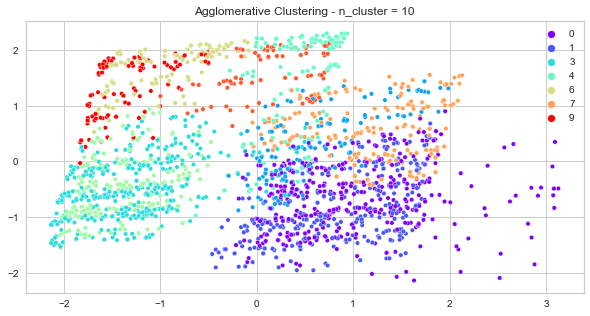

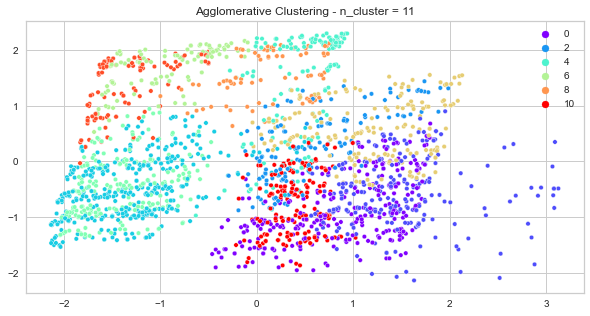

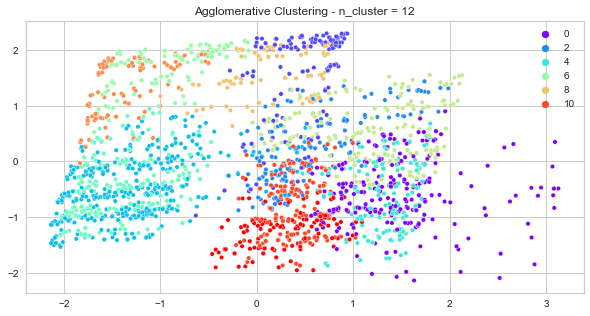

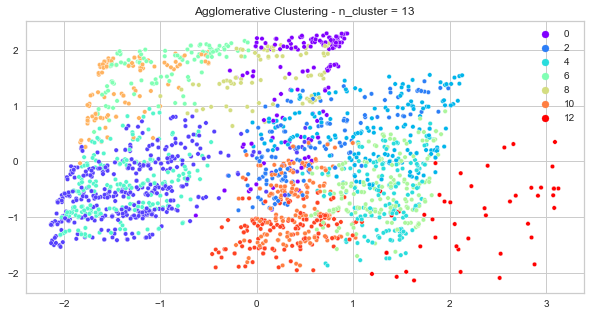

In [81]:
j=0
for i in range(len(aglo_per_k)):
    plt.figure(figsize=(10,5))
    sns.scatterplot(data_pca[:,0],data_pca[:,1],marker='o',s=20,hue=aglo_per_k[j].labels_,palette='rainbow')
    plt.title('Agglomerative Clustering - n_cluster = {}'.format(n_aglo[i]))
    plt.savefig('picture/agglomerative/agglomerative_%d.png' % i)
    j+=1
plt.show()

model terlihat rapih sama seperti k-means bentuk clusteringnya. maka untuk mendapatkan best agglomerative akan dilihat dari silhouette score nya

In [82]:
best_aglo = AgglomerativeClustering(n_clusters=3).fit(data_scale_encode)
labels_aglo = best_aglo.labels_

In [83]:
print("Estimated number of clusters    : %d" % len(set(labels_aglo)))
print("Silhouette Coefficient          : %0.3f" % metrics.silhouette_score(data_scale_encode, labels_aglo))
print('Calinski and Harabasz Index     : %0.3f' % metrics.calinski_harabasz_score(data_scale_encode, labels_aglo))
print('Davis Bouldin Index             : %0.3f' % metrics.davies_bouldin_score(data_scale_encode, labels_aglo))

Estimated number of clusters    : 3
Silhouette Coefficient          : 0.264
Calinski and Harabasz Index     : 670.667
Davis Bouldin Index             : 1.348


diambil cluster terbaik 3 dan silhouete score 0.264

### Model Gaussian Mixture

mencari jumlah cluster terbaik untuk gaussian mixture dengan merubah component

In [84]:
from sklearn.mixture import GaussianMixture
gms_per_comp = [GaussianMixture(n_components=comp, random_state=25).fit(data_reduced)for comp in range(1, 21)]

melihat BIC dan AIC untuk gaussian mixture dan diambil nilai yang paling kecil

In [85]:
bics = [model.bic(data_reduced) for model in gms_per_comp]
aics = [model.aic(data_reduced) for model in gms_per_comp]

for k in range(0, 20):
  print('Cluster : ', k+1, '\tBIC : ', bics[k], '\tAIC : ', aics[k])

Cluster :  1 	BIC :  7190.493814539602 	AIC :  6683.09933559977
Cluster :  2 	BIC :  -4727.504922409133 	AIC :  -5747.931596721461
Cluster :  3 	BIC :  -8903.986381598545 	AIC :  -10437.445251283369
Cluster :  4 	BIC :  -13434.420923389524 	AIC :  -15480.911988446845
Cluster :  5 	BIC :  -19100.30663345957 	AIC :  -21659.82989388939
Cluster :  6 	BIC :  -23813.043744374532 	AIC :  -26885.599200176846
Cluster :  7 	BIC :  -19817.96988111581 	AIC :  -23403.557532290622
Cluster :  8 	BIC :  -22975.738553616466 	AIC :  -27074.358400163776
Cluster :  9 	BIC :  -23460.954481592027 	AIC :  -28072.606523511833
Cluster :  10 	BIC :  -24079.391806862845 	AIC :  -29204.076044155147
Cluster :  11 	BIC :  -22625.629803022544 	AIC :  -28263.346235687342
Cluster :  12 	BIC :  -22245.14157849829 	AIC :  -28395.890206535587
Cluster :  13 	BIC :  -22463.871791354293 	AIC :  -29127.652614764083
Cluster :  14 	BIC :  -22765.423322323142 	AIC :  -29942.236341105432
Cluster :  15 	BIC :  -22696.17689194796 

visualisasi dari nilai AIC dan BIC

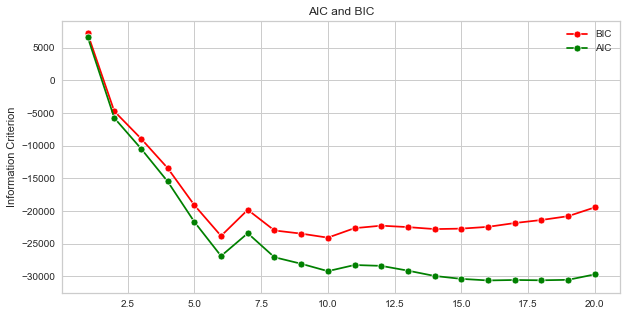

In [86]:
plt.figure(figsize=(10, 5))
sns.lineplot(x=range(1, 21), y=bics, marker='o',color='red')
sns.lineplot(x=range(1, 21), y=aics, marker='o',color='green')
plt.title('AIC and BIC')
plt.legend(['BIC', 'AIC'])
plt.ylabel('Information Criterion')
plt.show()

In [87]:
min_bic = np.infty

for k in range(1, 21):
    for covariance_type in ("full", "tied", "spherical", "diag"):
        bic = GaussianMixture(n_components=k,
                              covariance_type=covariance_type,
                              random_state=25).fit(data_reduced).bic(data_reduced)
        if bic < min_bic:
            min_bic = bic
            best_k = k
            best_covariance_type = covariance_type

print('Best - n_components    : ', best_k)
print('Best - covariance_type : ', best_covariance_type)

Best - n_components    :  10
Best - covariance_type :  full


In [88]:
k_gm = range(2, 19)
s_score_gm = [metrics.silhouette_score(data_reduced, gms_per_comp[i].predict(data_reduced)) for i in k_gm]

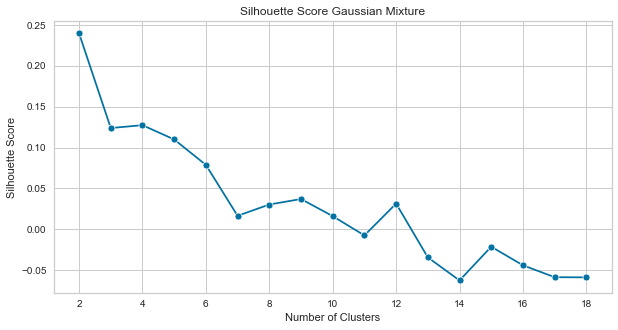

In [89]:
plt.figure(figsize=(10, 5))
sns.lineplot(x=k_gm, y=s_score_gm, marker='o').set(xlabel='Number of Clusters', ylabel='Silhouette Score')
plt.title('Silhouette Score Gaussian Mixture')
plt.savefig('picture/gm/silhouette_score_gaussian_mixture.png')
plt.show()

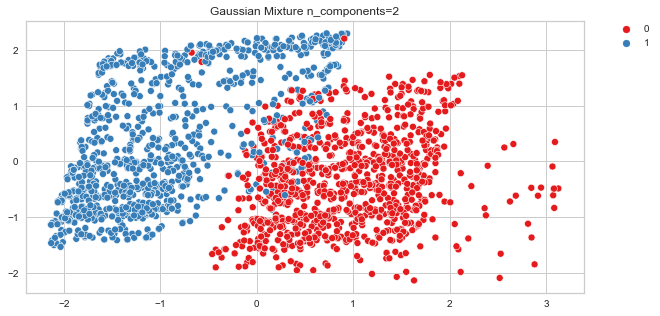

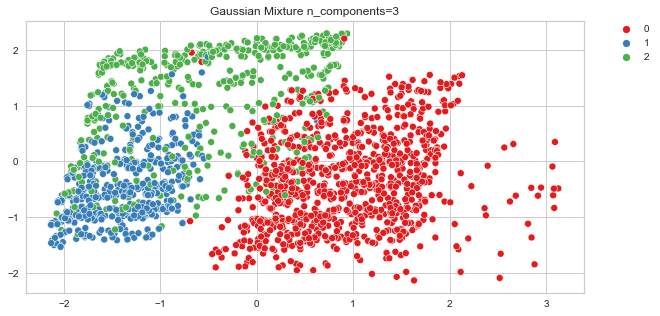

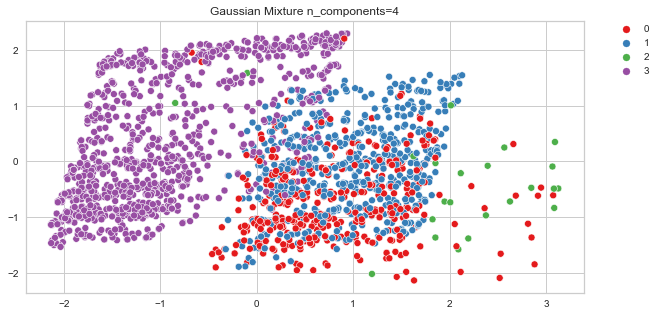

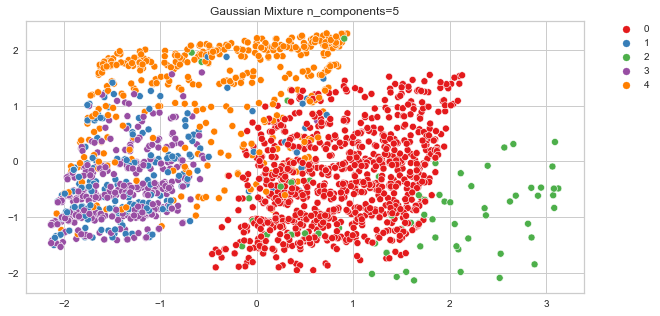

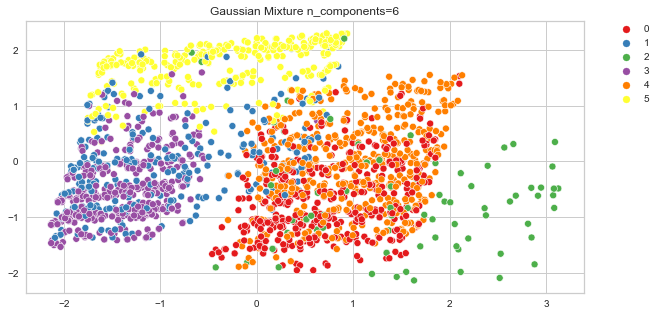

...

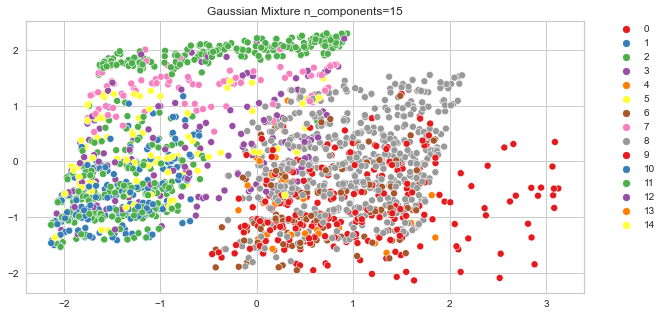

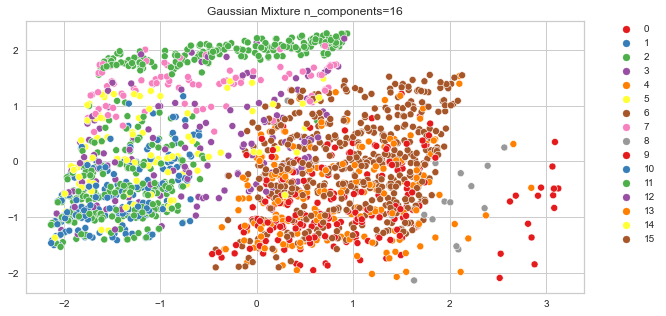

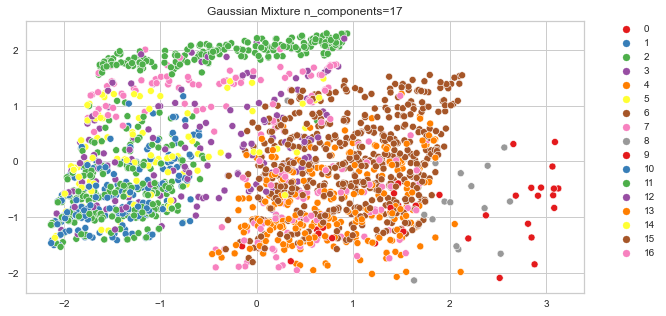

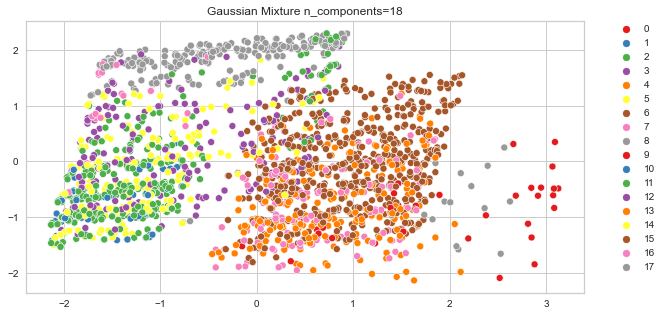

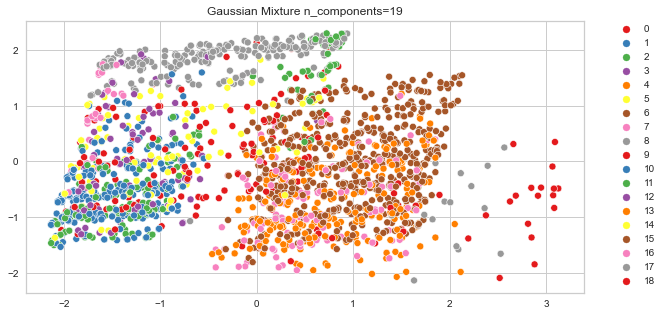

In [90]:
for i in range(1, 19):
    plt.figure(figsize=(10, 5))
    sns.scatterplot(x=data_pca[:, 0],
                    y=data_pca[:, 1], 
                    hue=gms_per_comp[i].predict(data_reduced),
                    palette="Set1",
                    legend='full').set(title=f'Gaussian Mixture n_components={gms_per_comp[i].n_components}')
    plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.)
    plt.savefig('picture/gm/gaussian_mixture_{}.png'.format(i))
    plt.show()

jumlah cluster terbaik dari nilai silhouette gaussian mixture adalah 2 maka akan diambil n=2

In [91]:
labels_gmm =gms_per_comp[1].predict(data_reduced)

In [92]:
print("Estimated number of clusters    : %d" % len(set(labels_gmm)))
print("Silhouette Coefficient          : %0.3f" % metrics.silhouette_score(data_reduced, labels_gmm))
print('Calinski and Harabasz Index     : %0.3f' % metrics.calinski_harabasz_score(data_reduced, labels_gmm))
print('Davis Bouldin Index             : %0.3f' % metrics.davies_bouldin_score(data_reduced, labels_gmm))

Estimated number of clusters    : 2
Silhouette Coefficient          : 0.257
Calinski and Harabasz Index     : 708.744
Davis Bouldin Index             : 1.645


jumlah kluster terbaik dari gaussian mixture ada 2 dan nilai silhouette score 0.257

## hyperparameter tuning

##### *dikarenakan silhouette score terbaik ada pada model  Kmeans maka diambil model ini untuk dilakukan hyperparameter tuning*

melakukan hyperparameter tuning menggunakan for loop karena grid search cv tidak mensupport silhouette score dan custom scoring tidak bisa digunakan juga untuk membuat scoring silhouette score.

parameter yang dicari adalah:
- n_cluster = [2 sampai 20]
- n_init = [5, 10, 15]
- algoritma = [auto, full, elkan]

In [93]:
gridsearch = pd.DataFrame()

num_cluster = []
algorithms = []
n_inits_s = []
sil_score = []

for n_clus in range(2, 20):
    for n_inits in [5,10,15]:
        for algorithm in ('auto', 'full', 'elkan'):
            model_search = KMeans(n_clusters=n_clus, algorithm=algorithm,n_init=n_inits, random_state=25)
            model_search.fit(data_reduced)
            labels_search = model_search.labels_

            # memasukan nilai ke dalam variabel list
            num_cluster.append(n_clus)
            algorithms.append(algorithm)
            n_inits_s.append(n_inits)
            sil_score.append(metrics.silhouette_score(data_reduced, labels_search))
        
gridsearch['n_clusters'] = num_cluster
gridsearch['algorithm'] = algorithms
gridsearch['n_inits'] = n_inits_s
gridsearch['silhouette_score'] = sil_score
gridsearch.sort_values(by='silhouette_score', ascending=False, inplace=True)

setelah mengetahui semua kombinasi kemudian dilakukan sortir dari silhouette score tertinggi

In [94]:
gridsearch.head(10)

,n_clusters,algorithm,n_inits,silhouette_score
14,3,elkan,10,0.275697
13,3,full,10,0.275697
17,3,elkan,15,0.275697
16,3,full,15,0.275697
15,3,auto,15,0.275697
9,3,auto,5,0.275697
10,3,full,5,0.275697
11,3,elkan,5,0.275697
12,3,auto,10,0.275697
35,5,elkan,15,0.264284


didapatkan score tertinggi 0.275697 atau kurang lebih sama dengan nilai kmeans default. maka akan dibuat model dengan hyperparameter yang berniliai sama dengan 0.275697

pada model diambil n_cluster 3, algoritma = elkan dan n_init = 15

In [95]:
best_model = KMeans(n_clusters=3, algorithm='elkan',n_init=15, random_state=25)

## Pipelines

membuat pipelines dari data langkah proses yang dilakukan terhadap data

In [96]:
num_columns_skew = ['Income', 'Kidhome', 'MntWines', 'MntFruits', 'MntMeatProducts',
                     'MntFishProducts', 'MntSweetProducts', 'MntGoldProds',
                     'NumDealsPurchases', 'NumWebPurchases', 'NumCatalogPurchases',
                     'NumStorePurchases']
num_columns_norm = [ 'Year_Birth', 'Teenhome', 'Recency', 'NumWebVisitsMonth']


numeric_transformer_skew = scaler_skew
numeric_transformer_norm = scaler_norm


preprocessor = ColumnTransformer(
    transformers=[
        ('numeric_skew', numeric_transformer_skew, num_columns_skew),
        ('numeric_norm', numeric_transformer_norm, num_columns_norm),
    ])



clf_model = Pipeline(steps=[('preprocessor', preprocessor), ('reduced',pca), ('classifier', best_model)])

dengan model pipeline adalah best model kmeans yang telah dibuat sebelumnya

In [97]:
clf_model_fit = clf_model.fit(data_cleaning)

fit model dengan data yang telah di cleaning

In [98]:
model_pred = clf_model_fit.predict(data_cleaning)

prediksi model dengan data yang telah di cleaning

In [99]:
silhouette_score(data_reduced, model_pred)

0.27200721567784264

didapatkan silhouette score yang hampir sama dengan yang ada di hyperparameter tuning

In [100]:
import pickle
with open('model/cluster_model.pkl', 'wb') as f:
    pickle.dump(clf_model_fit, f)

kemudian saving pipelines kedalam file cluster_model.pkl

## IX. EDA Cluster

melakukan predict label dengan model pipeline

In [101]:
best_label = clf_model_fit.predict(data_cleaning)

melakukan trimming dari data eda dan yang telah di hapus di trainnig

In [102]:
index_drop = eda_df.drop(data_outlier_clean.index)
eda2 = eda_df.drop(index_drop.index)

membuat kolom cluster

In [103]:
eda2['Cluster'] = best_label

melihat distribusi jumlah cluster

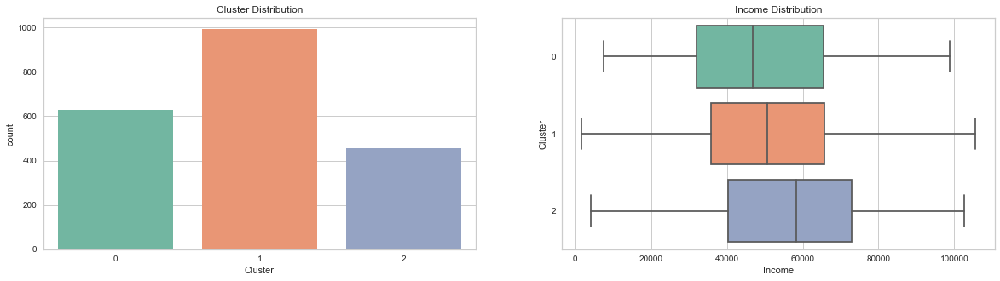

In [104]:
fig, ax = plt.subplots(1,2,figsize=(20, 5))

sns.countplot(x='Cluster', data=eda2,palette='Set2',ax=ax[0]).set(title='Cluster Distribution')
sns.boxplot(y='Cluster', x='Income', data=eda2, palette='Set2',orient='h', whis=1.5, showfliers=False,ax=ax[1]).set(title='Income Distribution')
plt.savefig('picture/cluster/cluster_distribution.png')
plt.show()


melihat scatter dari income dan jumlah barang yang di beli

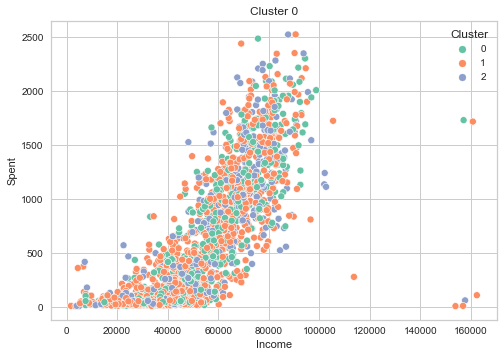

In [105]:
sns.scatterplot(x='Income', y='Spent', data=eda2,hue='Cluster', palette='Set2').set(title='Cluster 0')
plt.savefig('picture/cluster/dist.png')

dari incomenya ketiga cluster memiliki distribusi yang hampir sama

In [106]:
Personal = [ "Kidhome","Teenhome", "Age"]

def plot_cluster(eda2,i):
    plt.figure()
    sns.jointplot(x=eda2[i], y=eda2["Spent"], hue =eda2["Cluster"], kind="kde", palette='Set2')
    plt.title(f'Item Spending vs {i}')
    plt.savefig('picture/cluster/{}.png'.format(i))
    plt.show()

melihat cluster memiliki anak atau tidak

<Figure size 576x396 with 0 Axes>

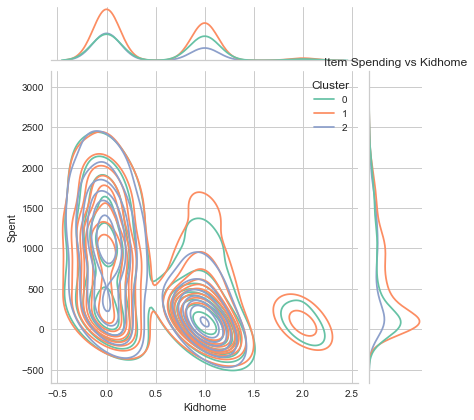

In [107]:
plot_cluster(eda2,'Kidhome')

orang yang memiliki anak 2 kemungkinnan masuk kedalam cluster 0 atau 1

<Figure size 576x396 with 0 Axes>

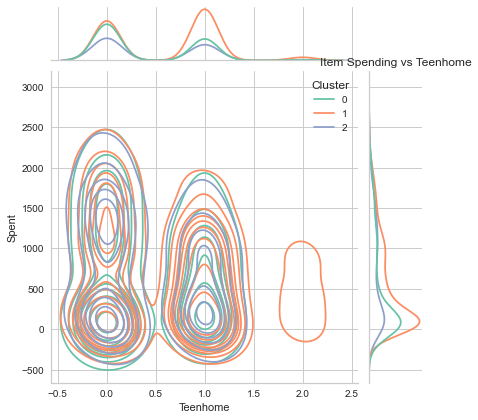

In [108]:
plot_cluster(eda2,'Teenhome')

costumer yang memiliki teenager 2 sudah pasti cluster 1

<Figure size 576x396 with 0 Axes>

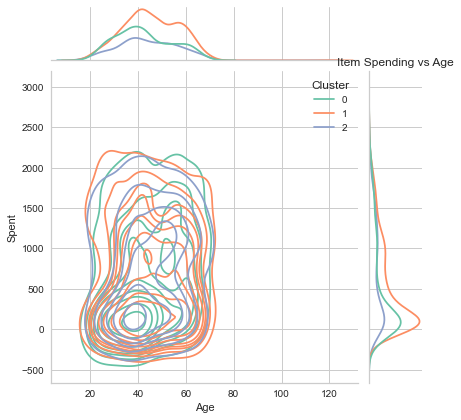

In [109]:
plot_cluster(eda2,'Age')

rata2 orang didalam cluster merupakan umur 20 sampai 70 tahun

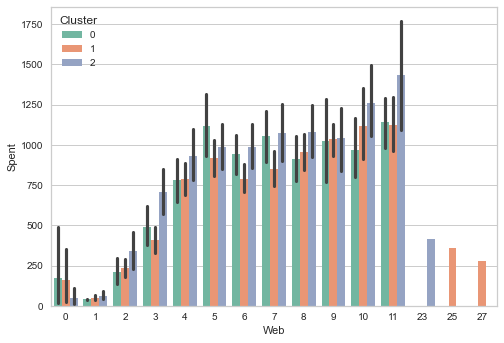

In [110]:
sns.barplot(x='Web', y='Spent', data=eda2,hue='Cluster', palette='Set2')
plt.savefig('picture/cluster/web.png')

pembelian dari web banyak dilakuaan oleh cluster 2

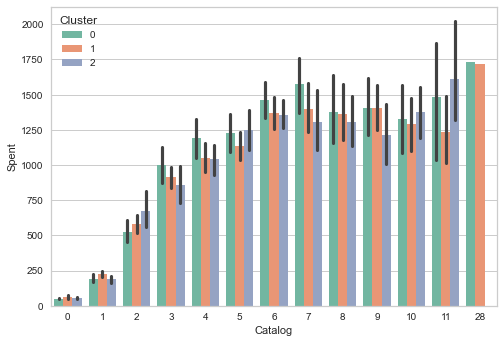

In [111]:
sns.barplot(x='Catalog', y='Spent', data=eda2,hue='Cluster', palette='Set2')
plt.savefig('picture/cluster/catalog.png')

pembelian dengan catalog cenderung banyak dilakukan oleh cluster 1 dan 2 frequensinya

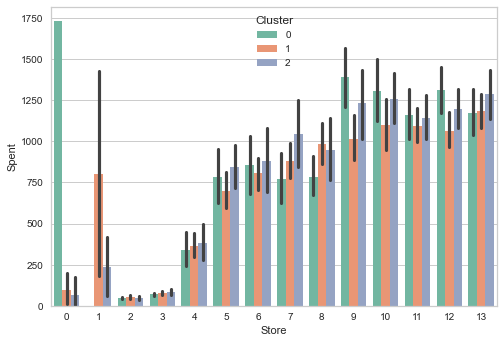

In [112]:
sns.barplot(x='Store', y='Spent', data=eda2,hue='Cluster', palette='Set2')
plt.savefig('picture/cluster/store.png')

cluster 0 adalah customer yang jarang sekali untuk berbelanja ke store, cluster 1 kebanyakan merupakan orang yang berbelanja banyak sekali kemudian hilang

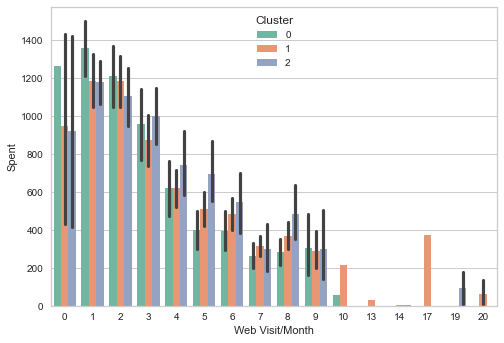

In [113]:
sns.barplot(x='Web Visit/Month', y='Spent', data=eda2,hue='Cluster', palette='Set2')
plt.savefig('picture/cluster/web_visit.png')

plotting recency vs spent

<Figure size 576x396 with 0 Axes>

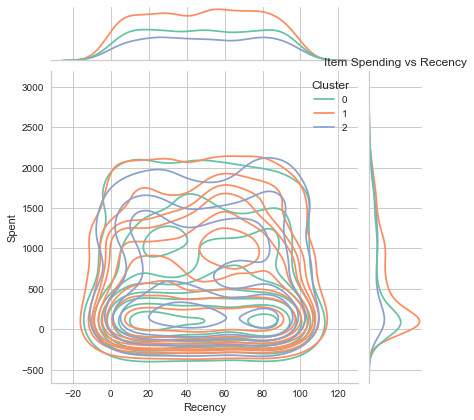

In [114]:
plot_cluster(eda2,'Recency')

plot cluster vs store

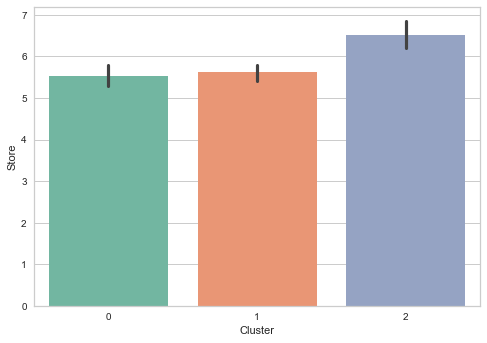

In [115]:
sns.barplot(x='Cluster', y='Store', data=eda2, palette='Set2')
plt.savefig('picture/cluster/store1.png')

plot cluster vs web purchase

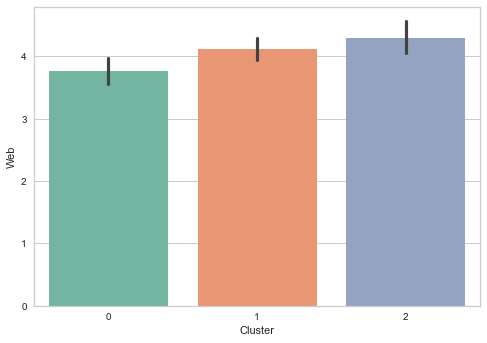

In [116]:
sns.barplot(x='Cluster', y='Web', data=eda2, palette='Set2')
plt.savefig('picture/cluster/web1.png')

plotting catalog purchase vs cluster

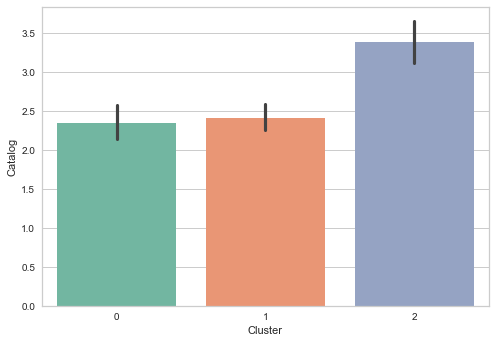

In [117]:
sns.barplot(x='Cluster', y='Catalog', data=eda2, palette='Set2')
plt.savefig('picture/cluster/catalog1.png')

plotting cluster vs Discount purchase

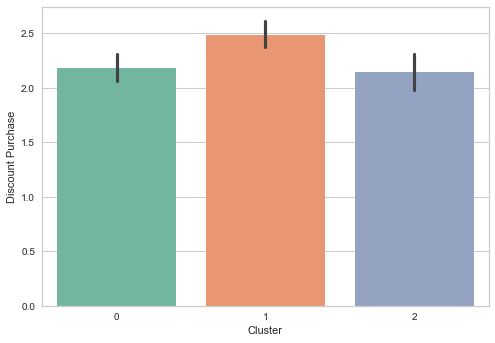

In [118]:
sns.barplot(x='Cluster', y='Discount Purchase', data=eda2, palette='Set2')
plt.savefig('picture/cluster/discount.png')

plotting cluster vs web visit

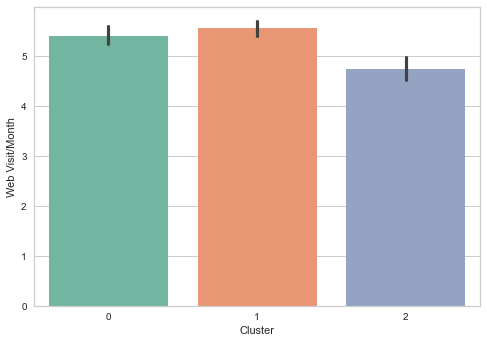

In [119]:
sns.barplot(x='Cluster', y='Web Visit/Month', data=eda2, palette='Set2')
plt.savefig('picture/cluster/web_visit1.png')

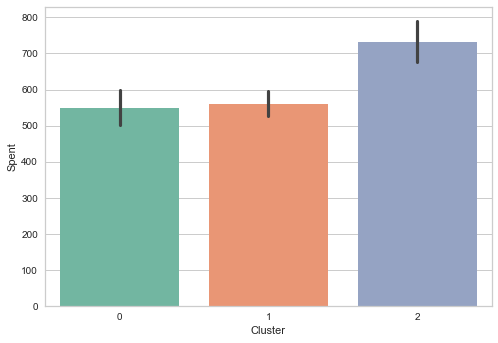

In [120]:
sns.barplot(x='Cluster', y='Spent', data=eda2, palette='Set2')
plt.savefig('picture/cluster/spent.png')

 Dari plotting diatas maka dapat disimpulkan bahwa apabila customer memiliki anak kecil atau teenager mereka cenderung untuk tidak membeli dengan jumlah yang banyak

cluster 0 
- cenderung memiliki income rendah
- cenderung tidak datang ke store berkali-kali
- merupakan costumer dengan pembelian rendah
- cenderung memiliki anak dan sebagai parents

cluster 1
- memiliki income yang menengah
- cenderung mencari discount dalam pembelian
- memrupakan parents yang memiliki anak yang cenderung banyak

cluster 2
- cenderung memiliki income yang tinggi
- cenderung untuk tidak memiliki anak banyak 
- pembelian cenderung dari catalog, namun masih tetap banyak membeli di web dan store
- merupakan pembeli loyal

## IX. Model Inference

model inference dilakukan untuk mencoba menguji model dengan data baru diluar dari data yang menjadi model training. data inference disimulasikan bahwa ada data baru yang akan di predict dari model yang sudah dibuat.

### A. Selecting inference data

pertama, melakukan pemilihan feature di data inference sesuai dengan kebutuhan model

In [121]:
data_inf

,ID,Year_Birth,Education,Marital_Status,Income,Kidhome,Teenhome,Dt_Customer,Recency,MntWines,...,NumWebVisitsMonth,AcceptedCmp3,AcceptedCmp4,AcceptedCmp5,AcceptedCmp1,AcceptedCmp2,Complain,Z_CostContact,Z_Revenue,Response
0,10736,1971,Graduation,Single,72258.0,0,1,12-09-2013,28,522,...,2,0,0,0,0,0,0,3,11,0
1,9799,1968,PhD,Divorced,83664.0,1,1,08-05-2013,57,866,...,5,0,0,0,0,0,0,3,11,0
2,9925,1981,PhD,Together,39665.0,1,0,25-05-2013,97,127,...,7,1,0,0,0,0,0,3,11,0
3,7321,1962,Graduation,Together,76081.0,0,0,23-05-2014,85,292,...,2,0,0,0,1,0,0,3,11,0
4,8278,1990,PhD,Married,74214.0,0,0,26-08-2012,3,863,...,5,0,0,0,0,0,0,3,11,0
5,2995,1957,Master,Together,66636.0,0,0,17-08-2013,64,291,...,1,0,0,0,0,0,0,3,11,0
6,1071,1976,PhD,Divorced,70179.0,0,1,21-07-2013,10,532,...,5,0,0,0,0,0,0,3,11,0
7,8925,1965,Master,Married,70053.0,0,1,03-07-2013,38,512,...,5,0,0,0,0,0,0,3,11,0
8,3083,1974,Graduation,Married,45837.0,1,1,26-07-2013,88,215,...,7,0,0,0,0,0,0,3,11,0
9,6887,1967,Graduation,Single,79146.0,1,1,24-04-2014,33,245,...,6,0,0,0,0,0,0,3,11,0


dropping kolom yang tidak terpakai

In [122]:
data_inf_select = data_inf.drop(['ID','Z_CostContact', 'Z_Revenue'],axis=1)

### D. Predict & Evaluation

mengambil kolom yang akan dipakai didalam model

In [123]:
data_inf_select = data_inf_select[num_columns_norm+num_columns_skew]
data_inf_select

,Year_Birth,Teenhome,Recency,NumWebVisitsMonth,Income,Kidhome,MntWines,MntFruits,MntMeatProducts,MntFishProducts,MntSweetProducts,MntGoldProds,NumDealsPurchases,NumWebPurchases,NumCatalogPurchases,NumStorePurchases
0,1971,1,28,2,72258.0,0,522,0,522,227,120,134,2,6,9,5
1,1968,1,57,5,83664.0,1,866,21,151,28,21,86,3,2,2,12
2,1981,0,97,7,39665.0,1,127,1,56,0,1,31,3,4,2,3
3,1962,0,85,2,76081.0,0,292,30,415,63,33,200,1,4,5,4
4,1990,0,3,5,74214.0,0,863,83,547,86,99,33,1,8,2,5
5,1957,0,64,1,66636.0,0,291,10,689,84,10,0,1,3,4,9
6,1976,1,10,5,70179.0,0,532,88,168,69,44,133,3,7,3,13
7,1965,1,38,5,70053.0,0,512,53,98,81,179,89,3,8,5,10
8,1974,1,88,7,45837.0,1,215,13,87,17,17,24,5,6,2,5
9,1967,1,33,6,79146.0,1,245,16,223,21,43,16,2,8,1,8


hasil dari clustering prediksi

In [124]:
pred = clf_model_fit.predict(data_inf_select)
pred

array([2, 1, 0, 2, 0, 2, 1, 1, 1, 1])

## X. Pengambilan Kesimpulan

- model kmeans memiliki nilai silhouette 0.276 dengan jumlah cluster terbaik adalah 3
- model DBscan memiliki nilai silhouette 0.252 dengan jumlah cluster terbaik adalah 3
- model Agglomerative clustering memiliki nilai silhouette 0.264 dengan jumlah cluster terbaik adalah 3
- model Gaussian Mixture memiliki nilai silhouette 0.257 dengan jumlah cluster terbaik adalah 2

maka diambil kmeans untuk dilakukan model improvement dengan melakukan hyperparameter tuning. didapatkan hasil kmeans yang sama dengan skor maksimum pada model default

apabila customer memiliki anak kecil atau teenager mereka cenderung untuk tidak membeli dengan jumlah yang banyak

cluster 0 
- cenderung memiliki income rendah
- cenderung tidak datang ke store berkali-kali
- merupakan costumer dengan pembelian rendah
- cenderung memiliki anak

cluster 1
- memiliki income yang menengah
- cenderung mencari discount dalam pembelian
- merupakan parents yang memiliki anak yang cenderung banyak

cluster 2
- cenderung memiliki income yang tinggi
- cenderung untuk tidak memiliki anak banyak 
- pembelian cenderung dari catalog, namun masih tetap banyak membeli di web dan store
- merupakan pembeli loyal
  

## XI. Referensi

Ghozali, I. 2016, Aplikasi Analisis Multivariete Dengan Program IBM SPSS 23. Edisi 8. Semarang: Badan Penerbit Universitas Diponegoro.

Meriyani, 2021, MEMAHAMI UJI MULTIKOLINEARITAS DALAM MODEL REGRESI., Retrived From https://accounting.binus.ac.id/2021/08/06/memahami-uji-multikolinearitas-dalam-model-regresi/

Scikit-learn: Machine Learning in Python, Pedregosa et al., JMLR 12, pp. 2825-2830, 2011., citation link https://jmlr.csail.mit.edu/papers/v12/pedregosa11a.html

Dataset: Customer Personality Analysis., Kaggle., Retrived From https://www.kaggle.com/datasets/imakash3011/customer-personality-analysis?datasetId=1546318&sortBy=voteCount

